# Trabalho da disciplina de Mineração de Dados em Grafos - Turma 09 - Análise de dados 
Aluno: Victor Lamark Costa Brasil 
Matricula: 2427315

# 1. Nessa seção será realizado estudo superficial sobre os dataset disponibilizados no site Albert-Lászlo Barabási 

## Nessa subseção é realizado as importação das bibliotecas que foram usadas no projeto
as instalações foram realizadas por meio do arquivo txt requirements.txt

In [43]:
# relação de bibliotecas usadas no projeto
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from concurrent.futures import ThreadPoolExecutor, as_completed
from networkx.algorithms import community
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import geopandas as gpd
from shapely.geometry import Point, LineString
import folium
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from folium.plugins import PolyLineTextPath
import random
from folium.plugins import TimestampedGeoJson
import datetime
import networkx as nx


## 1.1. Leitura dos datasets 

Eu criei uma função para realizar a leitura dos datasets, adotei essa estratégia para facilitar a leitura dos arquivos e evitar repetição de código. Verdade é que já tinha feito trabalho para somente um dataset, na sexta eu descobri que era para ser feito com todos os datasets, então atualizei fonte criando funções para facilitar a leitura dos arquivos.

In [44]:
import os
import networkx as nx
from concurrent.futures import ThreadPoolExecutor, as_completed

def ler_rede(path):
    try:
        if os.path.exists(path):
            # Eu criei essa variável para armazenar os grafos lidos dos arquivos
            G = nx.read_edgelist(path, create_using=nx.Graph(), nodetype=int)
            nome = os.path.basename(path)
            print(f"✅ Lido com sucesso: {nome}")
            return nome, G
        else:
            print(f"⚠️ Arquivo não encontrado: {path}")
            return None, None
    except Exception as e:
        print(f"❌ Erro ao ler {path}: {e}")
        return None, None

def ler_redes_em_paralelo(paths, max_workers=10):
    # Crie as listas grafos e nomes para armazenar os resultados, 
    # dessa forma eu pude escalonar os processos desde a leitura dos arquivos até as analises dos grafos 
    grafos = []
    nomes = []
    # Usando ThreadPoolExecutor para ler os arquivos em paralelo
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = {executor.submit(ler_rede, path): path for path in paths}
        for future in as_completed(futures):
            nome, G = future.result()
            if G is not None:
                grafos.append(G)
                nomes.append(nome)
    return nomes, grafos

file_paths = [
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/metabolic.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/powergrid.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/protein.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/citation.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/email.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/actor.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/www.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/collaboration.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/phonecalls.edgelist.txt',
    r'C:/Users/victo/Documents/Ambiente/powergrid/dataset/internet.edgelist.txt'
]


nomes, grafos = ler_redes_em_paralelo(file_paths, max_workers=10)

✅ Lido com sucesso: protein.edgelist.txt✅ Lido com sucesso: powergrid.edgelist.txt

✅ Lido com sucesso: metabolic.edgelist.txt
✅ Lido com sucesso: phonecalls.edgelist.txt✅ Lido com sucesso: collaboration.edgelist.txt

✅ Lido com sucesso: email.edgelist.txt
✅ Lido com sucesso: internet.edgelist.txt
✅ Lido com sucesso: www.edgelist.txt
✅ Lido com sucesso: citation.edgelist.txt
✅ Lido com sucesso: actor.edgelist.txt


## 1.2 Analise superficial dos datasets originais

Nessa seção fiz analise bem superficial dos datasets. Poderia ter feitos mais analises sob os datasets, mas devido ao tamanho dos mesmos me restrigi a somente a quantidade de nós e arrestas dos datasets originais. 
No primeiro gráfico é a visualização da quantidade de nós; e 
No segundo  gráfico é a visualização da quantidade de arestas. 

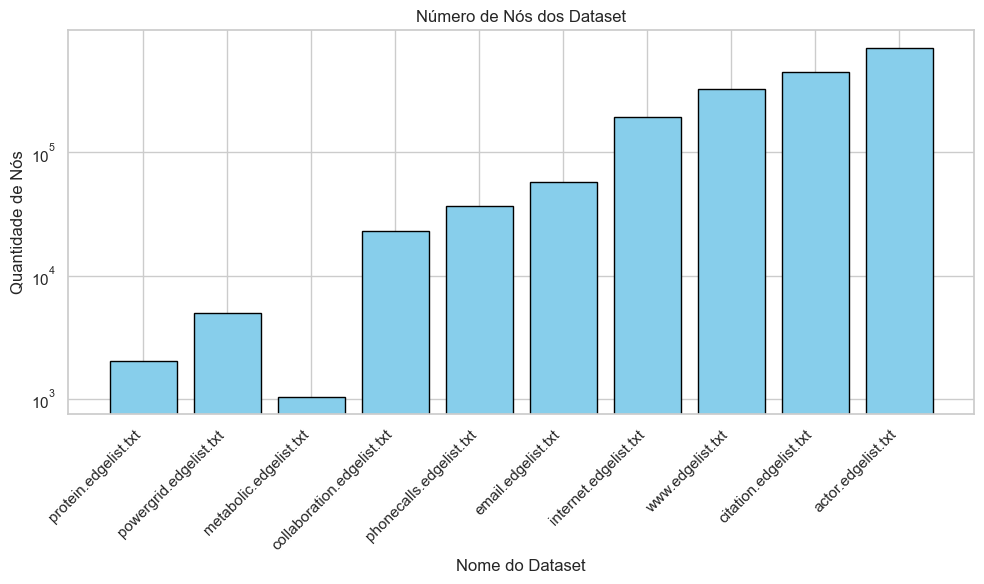

In [45]:
num_nos = [G.number_of_nodes() for G in grafos]

plt.figure(figsize=(10, 6))
plt.bar(nomes, num_nos, color='skyblue', edgecolor='black')
plt.title('Número de Nós dos Dataset')
plt.xlabel('Nome do Dataset')
plt.ylabel('Quantidade de Nós')
plt.yscale('log')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

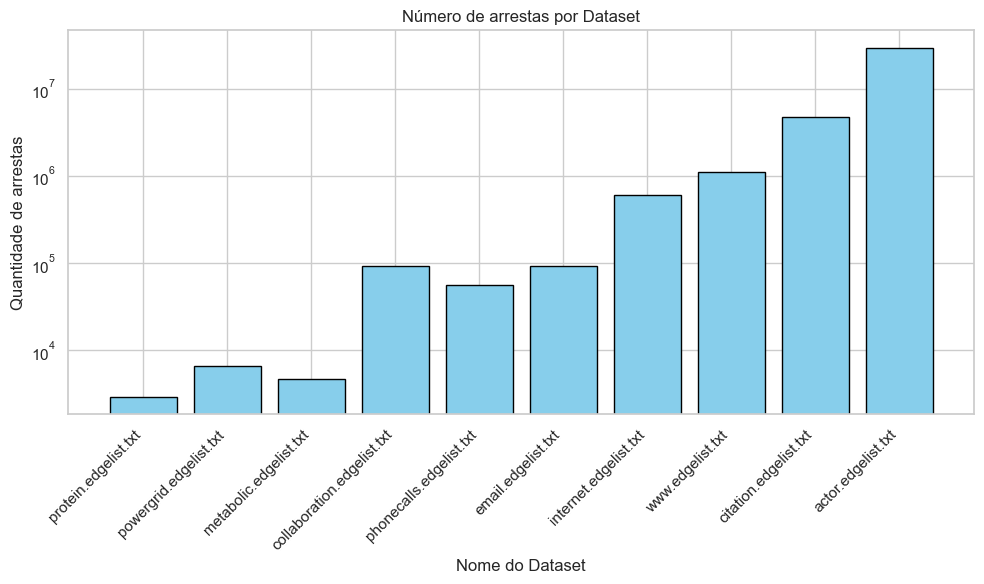

In [46]:
# Esse gráfico de barras mostra a quantidades de nós nos dataset originais
num_nos = [G.number_of_edges() for G in grafos]

plt.figure(figsize=(10, 6))
plt.bar(nomes, num_nos, color='skyblue', edgecolor='black')
plt.title('Número de arrestas por Dataset')
plt.xlabel('Nome do Dataset')
plt.yscale('log')
plt.ylabel('Quantidade de arrestas')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## 1.3 Criação do LLC (Largest Connect Componet) 

**Conceitos importantes:**

Componente Conectado: Em um grafo não direcionado, é um subconjunto de nós onde cada nó pode ser alcançado a partir de qualquer outro nó do mesmo subconjunto por meio de um caminho.
Largest Connected Component (LCC): É o maior desses componentes em termos de número de nós.

Em grafos direcionados, o análogo pode ser chamado de Largest Strongly Connected Component (LSCC) (quando cada nó pode alcançar todos os outros seguindo a direção das arestas) ou Largest Weakly Connected Component (LWCC) (quando ignoramos a direção das arestas).

**Uso da técnica:** 

Análise de Conectividade: Descobrir o núcleo principal da rede, que geralmente concentra a maior parte das interações ou comunicações.

Estudos de Resiliência e Robustez: Avaliar o quanto a rede permanece conectada após remoção de nós ou arestas (simulando falhas ou ataques).

Filtragem para análises: Muitas análises (como centralidade) são mais significativas se aplicadas somente no LCC para evitar distorções por subgrafos isolados muito pequenos.

Modelagem de Difusão: Processos como propagação de informação, doenças ou falhas frequentemente só são relevantes dentro do LCC.

**Interpretação de dados:**

Tamanho absoluto: Um LCC muito grande em relação ao tamanho total do grafo indica uma rede altamente conectada.

Tamanho relativo (LCC/ V): : Mede a proporção da rede que está interligada no maior bloco conectado.

Próximo de 1 → Rede densa e coesa.

Próximo de 0 → Rede fragmentada em vários grupos pequenos.

Mudança sob perturbação: A velocidade com que o LCC encolhe quando removemos nós pode indicar vulnerabilidade estrutural.

Visualmente: Em um grafo desenhado, o LCC normalmente é o maior “aglomerado” de nós conectados, enquanto outros componentes aparecem como ilhas isoladas menores.

**O quê foi feito:**

Meu o objetivo era reduzir os grafos para 3.000 nós, mantendo os nós mais conectados para facilitar a analise dos subdatasets. 



In [47]:
grafos_LCC = []
nomes_LCC = []

def reduzir_lcc(LCC, k=3000):
    """Reduz o LCC para os k nós de maior grau, mantendo a maior componente conexa."""
    if LCC.number_of_nodes() <= k:
        return LCC.copy()
    # Seleciona os k nós de maior grau
    top_nodes = [n for n, _ in sorted(LCC.degree, key=lambda x: x[1], reverse=True)[:k]]
    sub = LCC.subgraph(top_nodes).copy()
    # Garante que o resultado seja conexo (pega maior componente)
    if nx.is_connected(sub):
        return sub
    nodes_lcc = max(nx.connected_components(sub), key=len)
    return sub.subgraph(nodes_lcc).copy()

for nome, G in zip(nomes, grafos):
    # Encontra o maior componente conexo como conjunto de nós
    nodes_lcc = max(nx.connected_components(G), key=len)
    LCC = G.subgraph(nodes_lcc).copy()
    # Reduz para até 3000 nós
    LCC_reduzido = reduzir_lcc(LCC, k=3000)
    grafos_LCC.append(LCC_reduzido)
    nomes_LCC.append(nome)
    print(f"Largest Connected Component (LCC) for {nome}: {LCC_reduzido.number_of_nodes()} nodes")
    

Largest Connected Component (LCC) for protein.edgelist.txt: 1647 nodes
Largest Connected Component (LCC) for powergrid.edgelist.txt: 2888 nodes
Largest Connected Component (LCC) for metabolic.edgelist.txt: 1039 nodes
Largest Connected Component (LCC) for collaboration.edgelist.txt: 2990 nodes
Largest Connected Component (LCC) for phonecalls.edgelist.txt: 2683 nodes
Largest Connected Component (LCC) for email.edgelist.txt: 2980 nodes
Largest Connected Component (LCC) for internet.edgelist.txt: 2952 nodes
Largest Connected Component (LCC) for www.edgelist.txt: 2382 nodes
Largest Connected Component (LCC) for citation.edgelist.txt: 2958 nodes
Largest Connected Component (LCC) for actor.edgelist.txt: 3000 nodes


## 1.4 Analises dos LCCs reduzidos (subdatasets)

### 1.4.1 Quantidade de nós e quantidade de arestas.

Primeira analise para veririficar se a redução foi feita corretamente foi a quantidade de nós e arestas

In [48]:
for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC):
    print(f" O LCC do {nome}: Tem {LCC_reduzido.number_of_nodes()} nós e {LCC_reduzido.number_of_edges()} arestas")
    

 O LCC do protein.edgelist.txt: Tem 1647 nós e 2682 arestas
 O LCC do powergrid.edgelist.txt: Tem 2888 nós e 4181 arestas
 O LCC do metabolic.edgelist.txt: Tem 1039 nós e 4741 arestas
 O LCC do collaboration.edgelist.txt: Tem 2990 nós e 22879 arestas
 O LCC do phonecalls.edgelist.txt: Tem 2683 nós e 6168 arestas
 O LCC do email.edgelist.txt: Tem 2980 nós e 22036 arestas
 O LCC do internet.edgelist.txt: Tem 2952 nós e 38492 arestas
 O LCC do www.edgelist.txt: Tem 2382 nós e 120145 arestas
 O LCC do citation.edgelist.txt: Tem 2958 nós e 17133 arestas
 O LCC do actor.edgelist.txt: Tem 3000 nós e 968317 arestas


Histograma do número de nós dos grafos originais e LCC_reduzido

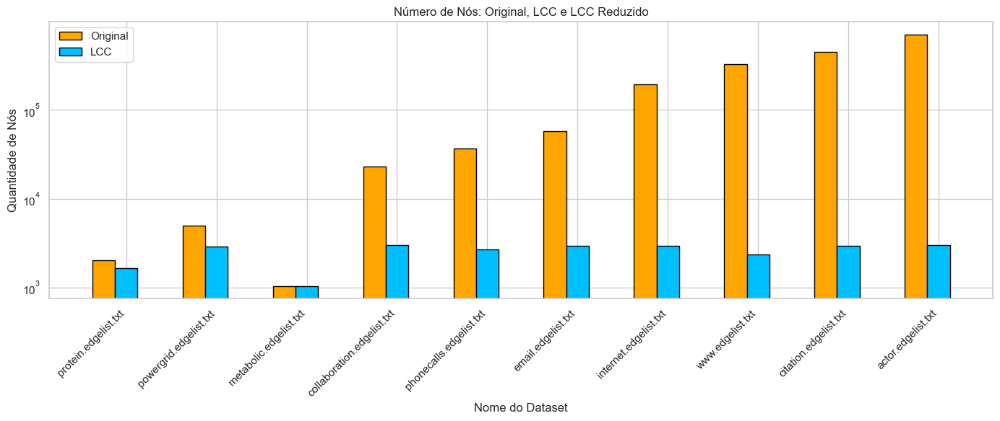

In [49]:
num_nos_originais = [G.number_of_nodes() for G in grafos]
num_nos_lcc = [G.number_of_nodes() for G in grafos_LCC]

plt.figure(figsize=(14, 6))
bar_width = 0.25
x = np.arange(len(nomes_LCC))

plt.bar(x - bar_width, num_nos_originais, width=bar_width, label='Original', color='Orange', edgecolor='black')
plt.bar(x, num_nos_lcc, width=bar_width, label='LCC', color='deepskyblue', edgecolor='black')


plt.xticks(x, nomes_LCC, rotation=45, ha='right')
plt.xlabel('Nome do Dataset')
plt.ylabel('Quantidade de Nós')
plt.yscale('log')
plt.title('Número de Nós: Original, LCC e LCC Reduzido')
plt.legend()
plt.tight_layout()
plt.show()

Podemos verificar que nos grafos_LCC abaixo tiveram uma redução significativa na quantidade de nós: 

1.phonecall, 2.email, 3. collaboratio, 4. www, 5. citation, 6. actor


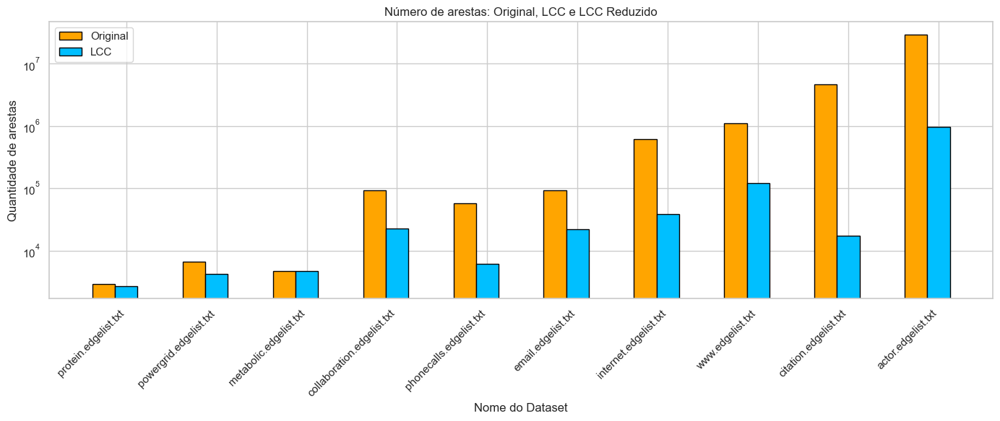

In [50]:
# Histograma do número de arrestas dos grafos originais, LCC e LCC reduzido

num_nos_originais = [G.number_of_edges() for G in grafos]
num_nos_lcc = [G.number_of_edges() for G in grafos_LCC]


plt.figure(figsize=(14, 6))
bar_width = 0.25
x = np.arange(len(nomes_LCC))

plt.bar(x - bar_width, num_nos_originais, width=bar_width, label='Original', color='Orange', edgecolor='black')
plt.bar(x, num_nos_lcc, width=bar_width, label='LCC', color='deepskyblue', edgecolor='black')


plt.xticks(x, nomes_LCC, rotation=45, ha='right')
plt.xlabel('Nome do Dataset')
plt.ylabel('Quantidade de arestas')
plt.yscale('log')
plt.title('Número de arestas: Original, LCC e LCC Reduzido')
plt.legend()
plt.tight_layout()
plt.show()

Podemos verificar que nos grafos_LCC abaixo tiveram uma redução significativa na quantidade de arestas: 

1.phonecall, 2.email, 3. collaboratio, 4. www, 5. citation, 6. actor


### 1.4.2 Médias do número de graus

***Conceitos importantes**

Grau de um nó (𝑘𝑖): Número de arestas conectadas a um nó 
Em grafos não direcionados, conta todas as conexões igualmente.
Em grafos direcionados, distingue-se entre grau de entrada e grau de saída 
Média do número de graus: É a soma de todos os graus dividida pelo número total de nós.

**Uso da técnica**
Métrica de conectividade geral: Ajuda a ter uma visão rápida da densidade local média da rede.
Comparação entre redes: Permite avaliar se uma rede é mais ou menos conectada que outra independentemente do tamanho.
Análise de robustez: Redes com média de grau baixa tendem a ser mais frágeis a remoções aleatórias de nós.

**Intepretação**
Valores altos → Rede mais conectada em média, possivelmente com caminhos curtos entre nós, mas também maior possibilidade de redundância.

Valores baixos → Rede esparsa, potencialmente fragmentada, maior distância média entre nós.

Distribuição importa: A média sozinha pode esconder desigualdades. Por exemplo, em redes com distribuição de grau altamente desigual (como redes escala-livres), a média pode ser baixa, mas ainda haver hubs com grau muito alto.

Visualmente: Em grafos com alta média de grau, o desenho tende a mostrar nós com muitas conexões densamente entrelaçadas. Em grafos de baixa média, os nós parecem mais dispersos e as ligações mais esparsas.

Redes físicas (powergrid, protein) → baixa conectividade por restrições físicas ou funcionais.

Redes sociais e de informação (phonecalls, email, collaboration, citation) → conectividade moderada a alta, refletindo interações humanas.

Redes digitais (internet, www) → muito mais conectadas devido à facilidade de criar links.

Redes de entretenimento (actor) → valores extremamente altos indicam quase-cliques, onde muitos nós estão ligados a quase todos os outros.

In [51]:
for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC):
    graus = dict(LCC_reduzido.degree()).values()
    media_graus = sum(graus) / len(graus) if graus else 0
    print(f"Média dos graus de {nome}: {media_graus}")


Média dos graus de protein.edgelist.txt: 3.2568306010928962
Média dos graus de powergrid.edgelist.txt: 2.8954293628808863
Média dos graus de metabolic.edgelist.txt: 9.126082771896053
Média dos graus de collaboration.edgelist.txt: 15.303678929765887
Média dos graus de phonecalls.edgelist.txt: 4.597838240775252
Média dos graus de email.edgelist.txt: 14.789261744966442
Média dos graus de internet.edgelist.txt: 26.07859078590786
Média dos graus de www.edgelist.txt: 100.87741393786735
Média dos graus de citation.edgelist.txt: 11.584178498985802
Média dos graus de actor.edgelist.txt: 645.5446666666667


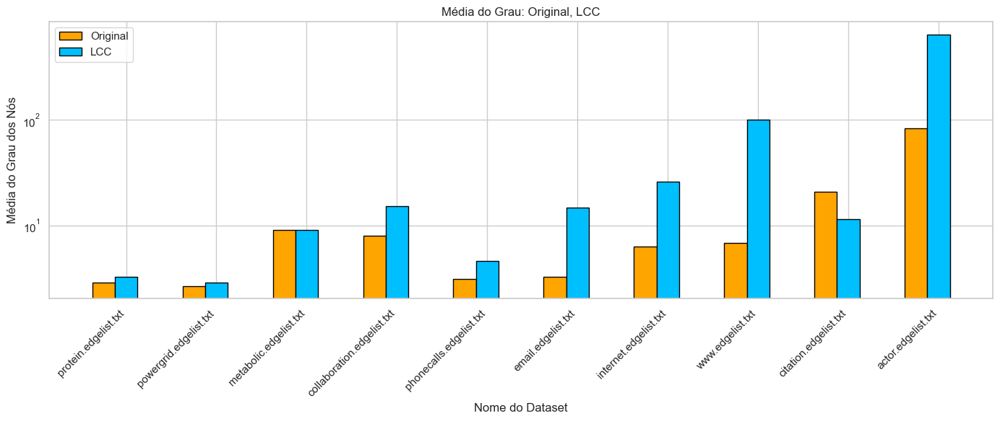

In [52]:
# Histograma das médias do número de graus dos grafos originais, LCC e LCC reduzido

def media_graus(grafos):
    return [np.mean([d for _, d in G.degree()]) for G in grafos]

medias_graus_originais = media_graus(grafos)
medias_graus_lcc = media_graus(grafos_LCC)


plt.figure(figsize=(14, 6))
bar_width = 0.25
x = np.arange(len(nomes_LCC))

plt.bar(x - bar_width, medias_graus_originais, width=bar_width, label='Original', color='orange', edgecolor='black')
plt.bar(x, medias_graus_lcc, width=bar_width, label='LCC', color='deepskyblue', edgecolor='black')


plt.xticks(x, nomes_LCC, rotation=45, ha='right')
plt.xlabel('Nome do Dataset')
plt.ylabel('Média do Grau dos Nós')
plt.yscale('log')
plt.title('Média do Grau: Original, LCC')
plt.legend()
plt.tight_layout()
plt.show()

Devido a redução do dataset é natural que a média do graus tenha diminuido.

### 1.4.3 Distribuição de graus da rede

A distribuição de graus da rede revela a forma como as conexões estão distribuidas. É a frequência com que os diferentes graus aparecem na rede. simplificando ela mostra quantos nós têm grau 1, quantos têm grau 2, e assim por diante. Ela é importante para identificar hubs (nós com muitos graus) e a estrutura geral da rede.
Dependendo do formato da distribuição, podemos inferir o tipo de rede 
Uniforme : todos os nós têm o mesmo grau ou bem próximas 
Poisson (rede aleatória): Pico em torno da média, poucos nós com graus muito diferentes
Cauda longa: Muitos nós com poucos links e poucos com muito links (hub)
Exponencial: Rápida queda de nós de alto grau, mas não tão abrupta quanto a poisson 


In [53]:
for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC):
    print(f"\nDistribuição de graus para {nome}:")
    Distribuicao_graus = pd.Series(dict(LCC_reduzido.degree()).values()).value_counts().sort_index()
    print(Distribuicao_graus)



Distribuição de graus para protein.edgelist.txt:
1     713
2     319
3     191
4     134
5      67
6      56
7      35
8      35
9      19
10     12
11     11
12     10
13      4
14      4
15      6
16      1
17      1
18      4
20      4
21      3
22      1
23      1
24      1
26      2
29      4
30      1
32      1
37      1
42      1
46      1
52      1
81      1
82      1
91      1
Name: count, dtype: int64

Distribuição de graus para powergrid.edgelist.txt:
1      242
2     1289
3      705
4      280
5      172
6       90
7       46
8       28
9       14
10      10
11      10
12       1
13       1
Name: count, dtype: int64

Distribuição de graus para metabolic.edgelist.txt:
1        6
2       71
3      145
4      172
5      203
6       86
7       82
8       67
9       41
10      23
11      20
12      12
13      15
14      11
15      13
16       7
17      10
18       5
19       4
20       1
21       3
22       5
23       5
24       3
25       1
26       2
27       1
28       3
29 

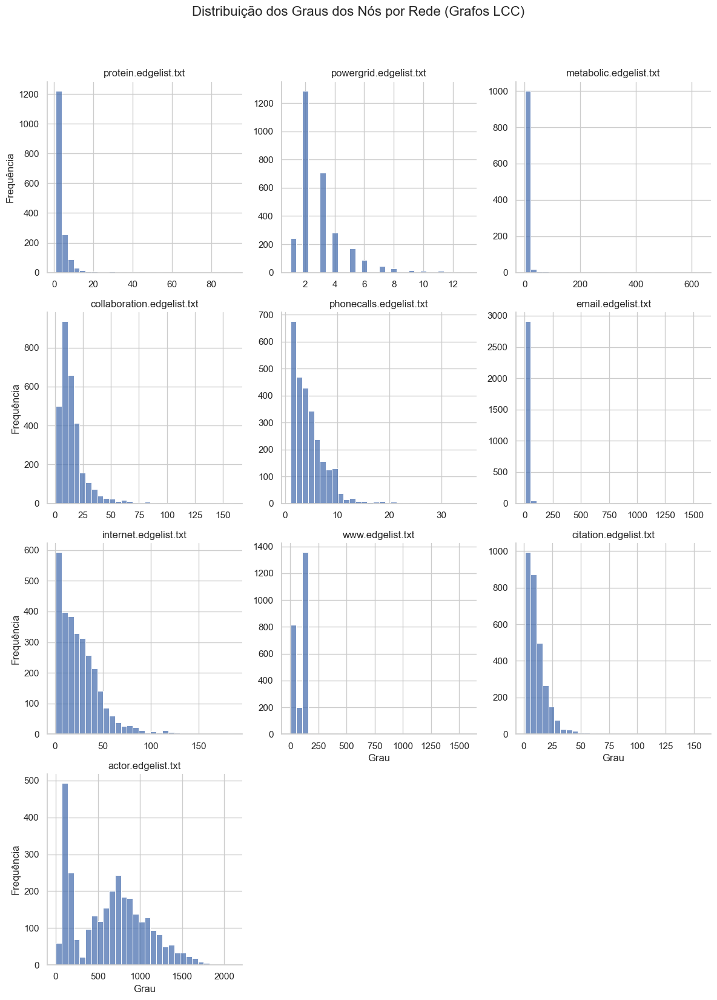

In [54]:
# Histograma da distribuição de graus (facetas) para cada nome dos grafos_LCC

graus_df = pd.DataFrame()

for nome, G in zip(nomes_LCC, grafos_LCC):
    graus = [d for n, d in G.degree()]
    temp_df = pd.DataFrame({'grau': graus, 'rede': nome})
    graus_df = pd.concat([graus_df, temp_df], ignore_index=True)

sns.set(style="whitegrid")
g = sns.FacetGrid(graus_df, col="rede", col_wrap=3, sharex=False, sharey=False, height=4)
g.map_dataframe(sns.histplot, x="grau", bins=30, kde=False)
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Grau", "Frequência")
g.fig.suptitle("Distribuição dos Graus dos Nós por Rede (Grafos LCC)", fontsize=16, y=1.03)
plt.tight_layout()
plt.show()

**Intepretação do gráfico:**

**Redes com baixa conectividade e distribuição estreita**
**"powergrid.edgelist.txt"** Pico claro em grau 2–3, poucos nós com grau acima de 8.

**Interpretação**: rede quase regular (grau parecido para todos), Vulnerabilidade: retirada de nós estratégicos (mesmo com grau baixo) pode fragmentar a rede.

**protein.edgelist.txt** Maioria com grau até 5, poucos acima de 20.

**Interpretação:** baixa redundância

**2. Redes moderadamente conectadas com cauda longa moderada**

**phonecalls.edgelist.txt** Decaimento suave: muitos nós com grau baixo, poucos hubs com grau até 30.

**Interpretação:** rede social humana com limites naturais de contatos, mas presença de hubs (pessoas muito conectadas).

**internet.edgelist.txt** Cauda longa mais estendida (graus chegando acima de 150).

**Interpretação:** rede livre de escala típica — muitos nós com baixa conexão e poucos nós extremamente conectados (roteadores centrais).

**3. Redes de informação e colaboração — altamente heterogêneas**
**email.edgelist.txt** Pico forte em graus muito baixos, mas com alguns nós ultrapassando 1500 conexões.

**Interpretação:** rede de e-mails com hubs gigantes (listas de distribuição, servidores), alta heterogeneidade.

**collaboration.edgelist.txt** Cauda longa até ~150, mas maioria dos nós com menos de 10 conexões.

**Interpretação:** muitos autores com poucos coautores e poucos super-colaboradores.

**citation.edgelist.txt** Pico baixo e cauda longa moderada (até ~150).

**Interpretação:** muitos artigos citam poucos outros, mas alguns têm altíssima conectividade (revisões ou artigos seminais).

**4. Redes extremamente conectadas**
**www.edgelist.txt** Forte pico em torno de 200 conexões, quase nenhum grau muito acima disso.

**Interpretação:** rede densa, possivelmente subset restrito de páginas web fortemente interligadas.

**actor.edgelist.txt** Distribuição ampla e alta conectividade média; muitos nós com centenas de conexões e cauda até quase 2000.

**Interpretação:** rede quase clique — atores participam com muitos outros, estrutura de alta densidade.



### 1.4.4 Médias das distâncias entre os nós

**Conceitos importantes**
Número mínimo de arestas necessárias para ir de u a v (caminho mais curto, também chamado de shortest path).
Em grafos ponderados, considera-se o peso acumulado mínimo ao longo do caminho.
Em grafos não ponderados, cada aresta vale 1.
Média das distâncias (𝐿): Média de todas as distâncias mais curtas possíveis entre pares de nós conectados

A média das distâncias entre os nós é calculada como a soma das distâncias mais curtas entre todos os pares de nós, dividida pelo número total de pares de nós. A fórmula para calcular a média das distâncias entre os nós é:

média das distâncias = (somatório das distâncias mais curtas entre todos os pares de nós) / (número total de pares de nós)

**Uso da técnica**
Medir a eficiência de comunicação entre nós em redes, quanto menor mais eficiente. 
Monitorar mudanças na rede, alterações de topologia (remoção de nósfalhas ou adições) afetam diretamente a distância média

**Interpretações**

Valores baixos de D e L indicam que a rede é eficiente e bem conectada.
Valores altos de D e L indicam que a rede é ineficiente e mal conectada.
 



In [55]:
def analisar_grafo(nome, LCC_reduzido):
    try:
        if nx.is_connected(LCC_reduzido):
            medias_distancias = nx.average_shortest_path_length(LCC_reduzido)
            return f"\nMédia das distâncias entre nós para {nome}:\nMédia das distâncias entre os nós: {medias_distancias:.4f}"
        else:
            maior_componente = max(nx.connected_components(LCC_reduzido), key=len)
            LCC_reduzido_sub = LCC_reduzido.subgraph(maior_componente).copy()
            if nx.is_connected(LCC_reduzido_sub):
                medias_distancias = nx.average_shortest_path_length(LCC_reduzido_sub)
                return f"\nMédia das distâncias entre nós para {nome}:\nGrafo desconexo — analisando maior componente\nMédia das distâncias: {medias_distancias:.4f}"
            else:
                return f"\nMédia das distâncias entre nós para {nome}:\nGrafo desconexo — até o maior componente é desconexo"
    except Exception as e:
        return f"\nMédia das distâncias entre nós para {nome}:\nErro ao processar: {e}"

# Em paralelo
with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [executor.submit(analisar_grafo, nome, LCC_reduzido) for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC)]
    for future in as_completed(futures):
        print(future.result())



Média das distâncias entre nós para metabolic.edgelist.txt:
Média das distâncias entre os nós: 2.4771

Média das distâncias entre nós para protein.edgelist.txt:
Média das distâncias entre os nós: 5.6117

Média das distâncias entre nós para powergrid.edgelist.txt:
Média das distâncias entre os nós: 17.5998

Média das distâncias entre nós para phonecalls.edgelist.txt:
Média das distâncias entre os nós: 8.4915

Média das distâncias entre nós para email.edgelist.txt:
Média das distâncias entre os nós: 2.6591

Média das distâncias entre nós para citation.edgelist.txt:
Média das distâncias entre os nós: 4.4353

Média das distâncias entre nós para collaboration.edgelist.txt:
Média das distâncias entre os nós: 3.7336

Média das distâncias entre nós para www.edgelist.txt:
Média das distâncias entre os nós: 3.9165

Média das distâncias entre nós para internet.edgelist.txt:
Média das distâncias entre os nós: 3.3369

Média das distâncias entre nós para actor.edgelist.txt:
Média das distâncias ent

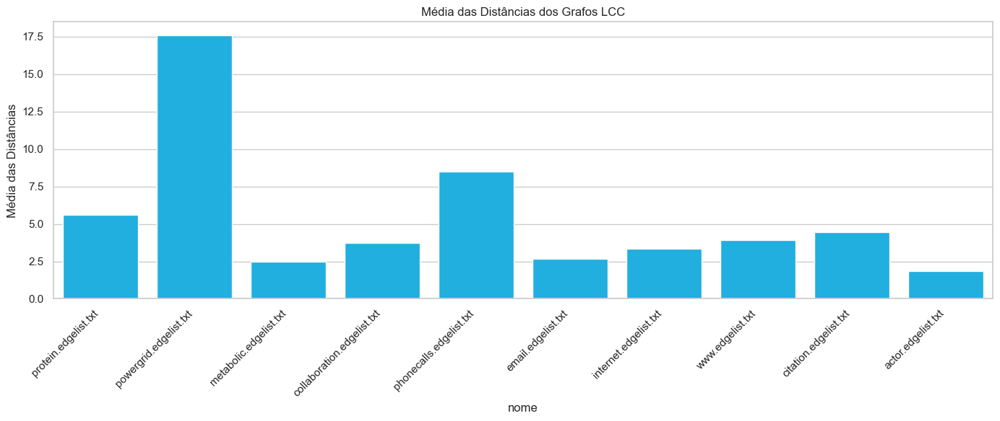

In [56]:
# Histograma da média das distâncias dos Grafos_LCC

def calcular_media_distancia(G):
    try:
        if nx.is_connected(G):
            return nx.average_shortest_path_length(G)
        else:
            maior_componente = max(nx.connected_components(G), key=len)
            G_sub = G.subgraph(maior_componente).copy()
            return nx.average_shortest_path_length(G_sub)
    except Exception:
        return np.nan

medias_distancias = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    medias_distancias.append(calcular_media_distancia(G))
    nomes_plot.append(nome)

df_dist = pd.DataFrame({
    'media_distancia': medias_distancias,
    'nome': nomes_plot
})

plt.figure(figsize=(14, 6))
sns.barplot(data=df_dist, x='nome', y='media_distancia', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Média das Distâncias')
plt.title('Média das Distâncias dos Grafos LCC')
plt.tight_layout()
plt.show()

**Intepretações do gráfico**

**powergrid** - Muito alta

**metabolic** - Muito baixa

**protein** Moderada

**phonecalls** - Alta

**email** - Baixa

**collaboration** - Baixa

**internet** - Baixa

**wwww** - Baixa

**citation** - Moderada

**actor** - Extremamente baixa




### 1.4.5 Diametro das redes

**Conceitos importantes** 
É a maior distância geodésica (caminho mais curto) entre quaisquer dois nós dentro de um componente conectado do grafo. Em grafos não ponderados, essa distância é o número máximo de arestas que compõem o menor caminho entre dois nós. Em grafos ponderados, considera-se o maior valor mínimo acumulado de peso entre dois nós.

**Uso da técnica**
Caracterizar a extensão da rede: Mede a “largura” máxima da rede em termos de passos de conexão
**Comparar topologias:**

 - Redes com diametros pequenos tendem a ser mais eficientes em comunicação.

 - Redes com diametros grandes indicam estruturas mais alongadas ou dispersas.

**Avaliar mudanças estruturais:** Adição ou remoção de arestas pode reduzir ou aumentar significativamente o diametro, influenciando processos como difusão e sincronização.

**Projetar redes:** Em engenharia de redes, busca-se reduzir o diametro para melhorar o desempenho.

**Interpretações**

Diametro alto → Rede com caminhos longos entre os pontos mais distantes, indicando potencial lentidão na comunicação ou propagação.

Diametro baixo → Estrutura compacta, com qualquer nó alcançável em poucas etapas.

Relação com distância média:

O diametro é sempre maior ou igual à distância média.

Distância média pequena com diametro alto pode indicar presença de poucas “pontes longas” conectando regiões afastadas.

In [ ]:
def analisar_grafo(nome, LCC):
    try:
        if nx.is_connected(LCC):
            diametro = nx.diameter(LCC)
            return f"\nDiametro de {nome}: {diametro:.4f}"
        else:
            maior_componente = max(nx.connected_components(LCC), key=len)
            LCC_sub = LCC.subgraph(maior_componente).copy()
            if nx.is_connected(LCC_sub):
                diametro = nx.diameter(LCC_sub)
                return (
                    f"\nDiametro de {nome}:\n"
                    f"Grafo desconexo — analisando maior componente conexo\n"
                    f"Diametro: {diametro:.4f}"
                )
            else:
                return (
                    f"\nDiametro de {nome}:\n"
                    f"Grafo desconexo — até o maior componente é desconexo\n"
                    f"Diametro não pôde ser calculado."
                )
    except Exception as e:
        return f"\nDiametro de {nome}:\nErro ao processar: {e}"

# Execução em paralelo 

with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [executor.submit(analisar_grafo, nome, LCC_reduzido) for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC)]
    for future in as_completed(futures):
        print(future.result())



Diâmetro de metabolic.edgelist.txt: 6.0000

Diâmetro de protein.edgelist.txt: 14.0000

Diâmetro de powergrid.edgelist.txt: 45.0000

Diâmetro de phonecalls.edgelist.txt: 25.0000

Diâmetro de email.edgelist.txt: 6.0000

Diâmetro de collaboration.edgelist.txt: 9.0000

Diâmetro de citation.edgelist.txt: 12.0000

Diâmetro de www.edgelist.txt: 9.0000

Diâmetro de internet.edgelist.txt: 10.0000

Diâmetro de actor.edgelist.txt: 4.0000


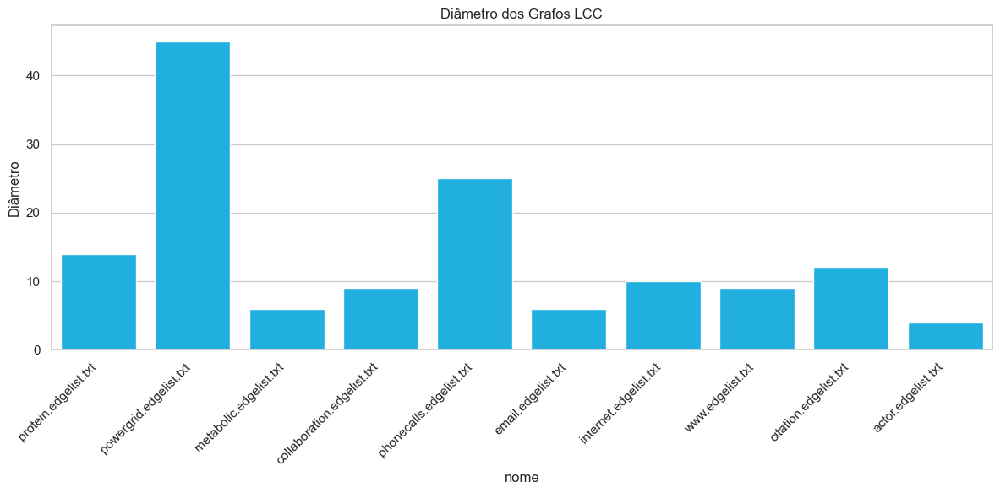

In [ ]:
# Histograma dos diametros dos grafos_LCC

diametros = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    if not nx.is_connected(G):
        # Trabalha com o maior componente conexo
        G = G.subgraph(max(nx.connected_components(G), key=len)).copy()
    try:
        diametro = nx.diameter(G)
    except Exception:
        diametro = np.nan
    diametros.append(diametro)
    nomes_plot.append(nome)

df_diam = pd.DataFrame({'diametro': diametros, 'nome': nomes_plot})

plt.figure(figsize=(12, 6))
sns.barplot(data=df_diam, x='nome', y='diametro', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Diametro')
plt.title('Diametro dos Grafos LCC')
plt.tight_layout()
plt.show()

**Intepretações sobre o gráfico**

**powergrid** - Muito alto

**metabolic** - Muito baixo 

**protein** - Moderado

**phonecalss** - Alto

**email** - Baixo

**collaboration** - Baixo

**internet** - Baixo

**www** Baixo

**Citation** - Moderado

**actor** Extremamente baixo


### 1.4.6 Transitividade das redes

**Conceitos importantes**
A transitividade é uma medida que indica a tendência de que os nós de um grafo formem triângulos.
Em outras palavras, ela mede a proporção de triângulos formados em relação ao número total de triângulos possíveis no grafo.
A transitividade é calculada como o número de triângulos no grafo dividido pelo número total de triângulos possíveis.
A fórmula para calcular a transitividade é:
Transitividade = (número de triângulos no grafo) / (número total de triângulos possíveis)
Ela nos mostra a densidade de conexões entre os nós, ou seja, quão conectados eles estão entre si.
A transitividade pode variar de 0 a 1, onde 0 significa que não há triângulos no grafo e 1 significa que todos os nós estão conectados formando triângulos. quanto maior a transitividade, mais forte é a rede e mais caminhos redundantes existem entre os nós.

**Uso da técnica**
**Caraterizar a coesão local:** Redes com alta transitividade tendem a ter comunidades mais densamente conectadas.
**Detecção de comunidades** : Redes com alta transitividade podem indicar a existência de comunidades
**Modelagem de redes** É parâmetro essencial para veririfcar se uma rede sintética reproduz o padrão de agrupamento observado em redes reais (small-world networks)

**Intepretação**
**T próximo de 1:** Quase todos os vizinhos de um nó estão conectados entre si; rede altamente agrupada.

**T próximo de 0:** Poucos ou nenhum triângulo; rede sem forte coesão local.


In [59]:
def analisar_grafo(nome, LCC_reduzido):
    try:
        if nx.is_connected(LCC_reduzido):
            transitividade = nx.transitivity(LCC_reduzido)
            return f"\nTransitividade de {nome}: {transitividade:.4f}"
        else:
            maior_componente = max(nx.connected_components(LCC_reduzido), key=len)
            LCC_reduzido_sub = LCC_reduzido.subgraph(maior_componente).copy()
            if nx.is_connected(LCC_reduzido_sub):
                transitividade = nx.transitivity(LCC_reduzido_sub)
                return (
                    f"\nTransitividade de {nome}:\n"
                    f"Grafo desconexo — analisando maior componente conexo\n"
                    f"Transitividade: {transitividade:.4f}"
                )
            else:
                return (
                    f"\nTransitividade de {nome}:\n"
                    f"Grafo desconexo — até o maior componente é desconexo\n"
                    f"Transitividade não pôde ser calculada."
                )
    except Exception as e:
        return f"\nTransitividade de {nome}:\nErro ao processar: {e}"

# Exemplo de uso em paralelo
with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [executor.submit(analisar_grafo, nome, LCC_reduzido) for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC)]
    for future in as_completed(futures):
        print(future.result())


Transitividade de citation.edgelist.txt: 0.2029

Transitividade de powergrid.edgelist.txt: 0.1402

Transitividade de metabolic.edgelist.txt: 0.0423

Transitividade de protein.edgelist.txt: 0.0237

Transitividade de phonecalls.edgelist.txt: 0.3042

Transitividade de collaboration.edgelist.txt: 0.2909

Transitividade de internet.edgelist.txt: 0.1729

Transitividade de email.edgelist.txt: 0.0037

Transitividade de www.edgelist.txt: 0.8799

Transitividade de actor.edgelist.txt: 0.5535


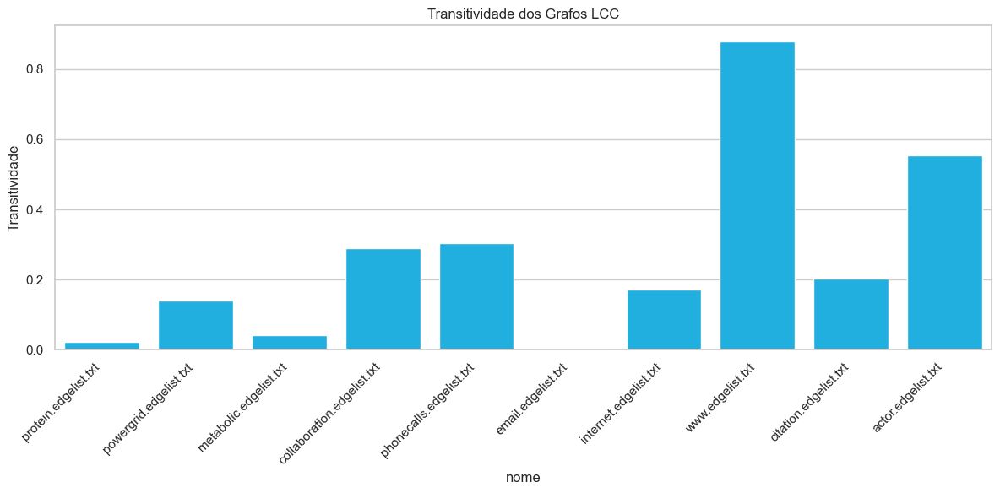

In [60]:
# Histograma da transitividade dos grafos_LCC

def calcular_transitividade(G):
    try:
        if nx.is_connected(G):
            return nx.transitivity(G)
        else:
            maior_componente = max(nx.connected_components(G), key=len)
            G_sub = G.subgraph(maior_componente).copy()
            return nx.transitivity(G_sub)
    except Exception:
        return np.nan

transitividades = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    transitividades.append(calcular_transitividade(G))
    nomes_plot.append(nome)

df_trans = pd.DataFrame({
    'transitividade': transitividades,
    'nome': nomes_plot
})

plt.figure(figsize=(12, 6))
sns.barplot(data=df_trans, x='nome', y='transitividade', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Transitividade')
plt.title('Transitividade dos Grafos LCC')
plt.tight_layout()
plt.show()

Seria ótimo realizar a comparação da transitividade dos grafos originais e grafos do LCC para veririficar se a transitividade foi  preservada. mas devido ao tempo limitado, não foi possível realizar essa comparação. mas é uma coisa que levarei para os meus caos reais de pesquisa.

**Intepretações sobre o gráfico**

**powergrid** - Baixa

**metabolic** - Muito baixa

**protein** - Muito baixa

**phonecalss** - Moderada

**email** - Moderada

**collaboration** - Moderada

**internet** - Baixa/Moderada

**www** Muito alta

**Citation** - Baixa/Moderada

**actor** alta



### 1.4.7 Densidade das redes

**Conceitos importantes**
Densidade é a razão entre o número de arestas existestes e número máximo possível de arestas na rede

**Uso da técnica**

**Medir a conectividade geral:** Fornece uma visão simples e normalizada da quantidade de conexões na rede 

**Comparar redes de tamanho diferentes** Como é uma medida relativa, permite comparação entre redes pequenas e grandes.

**Avaliar evolução da rede:** Usada para monitorar aumento ou diminuição de conexões ao longo do tempo.

**Filtrar redes para análise:** Redes muito densas ou muito esparsas podem exigir métodos específicos de visualização e análise.

**Diagnosticar eficiência estrutural:** Em redes de comunicação ou transporte, densidade mais alta pode indicar redundância de caminhos.

**Interpretação**

**Densidade alta** Rede fortemente conectada, possivelmente redundante, com baixo comprimento médio de caminho. Pode indicar sobreposição de conexões (não necessariamente eficiência máxima).

**Densidade baixa** Rede esparsa, possivelmente fragmentada, com caminhos mais longos e maior vulnerabilidade a cortes de conexão.

In [61]:
def analisar_grafo(nome, LCC_reduzido):
    try:
        if nx.is_connected(LCC_reduzido):
            densidade = nx.density(LCC_reduzido)
            return f"\nDensidade de {nome}: {densidade:.4f}"
        else:
            maior_componente = max(nx.connected_components(LCC_reduzido), key=len)
            LCC_reduzido_sub = LCC_reduzido.subgraph(maior_componente).copy()
            if nx.is_connected(LCC_reduzido_sub):
                densidade = nx.density(LCC_reduzido)
                return (
                    f"\nDensidade de {nome}:\n"
                    f"Grafo desconexo — analisando maior componente conexo\n"
                    f"Densidade: {densidade:.4f}"
                )

    except Exception as e:
        return f"\nDensidade de {nome}:\nErro ao processar: {e}"
    
    # Exemplo de uso

with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [executor.submit(analisar_grafo, nome, LCC_reduzido) for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC_reduzido)]
    for future in as_completed(futures):
        print(future.result())

NameError: name 'grafos_LCC_reduzido' is not defined

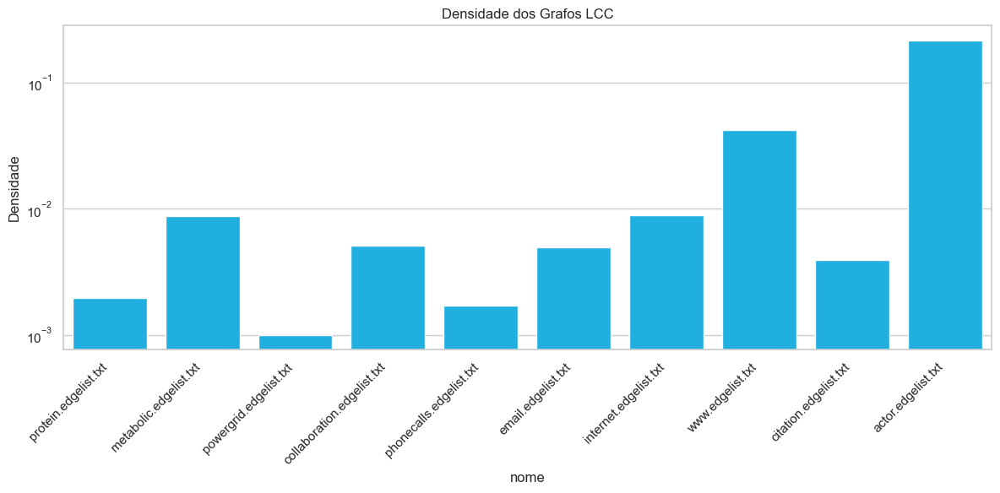

In [ ]:
# Histograma da densidade dos grafos_LCC

def calcular_densidade(G):
    try:
        if nx.is_connected(G):
            return nx.density(G)
        else:
            maior_componente = max(nx.connected_components(G), key=len)
            G_sub = G.subgraph(maior_componente).copy()
            return nx.density(G_sub)
    except Exception:
        return np.nan

densidades = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    densidades.append(calcular_densidade(G))
    nomes_plot.append(nome)

df_dens = pd.DataFrame({
    'densidade': densidades,
    'nome': nomes_plot
})

plt.figure(figsize=(12, 6))
sns.barplot(data=df_dens, x='nome', y='densidade', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Densidade')
plt.yscale('log')
plt.title('Densidade dos Grafos LCC')
plt.tight_layout()
plt.show()

Seria ótimo realizar a comparação da densidade dos grafos originais e grafos do LCC para veririficar se a densidade foi  preservada. mas devido ao tempo limitado, não foi possível realizar essa comparação. mas é uma coisa que levarei para os meus caos reais de pesquisa.

**Intepretações sobre o gráfico**

**powergrid** - Extremamente esparsa

**metabolic** - Baixa

**protein** - Muito esparsa

**phonecalss** - Baixa

**email** - Baixa

**collaboration** - Baixa

**internet** - Baixa/Moderada

**www** Moderada

**Citation** - Baixa

**actor** Alta

### 1.4.8 Comunidades das redes

**Conceitos importantes**
**Comunidade:** Um subconjunto de nós de uma rede com conexões mais densas entre si do que com o restante da rede.
**Detecção de comunidades:** Conjunto de algoritmos usados para identificar e isolar essas estruturas, revelando a organização mesoescala da rede.

Comunidades são grupos de nós dentro de um grafo que estão mais densamente conectados entre si do que com o resto do grafo. Elas são importantes para entender a estrutura e a organização do grafo, pois podem revelar subgrupos ou clusters de nós que compartilham características ou funções semelhantes. 
A detecção de comunidades pode ajudar a identificar padrões, funções ou comportamentos específicos dentro da rede.
Eu preferi utilizar o (clauset, Newman e Moore) (greedy_modularity_communities) para detectar as comunidades, primeiramente porque pesquisando sobre as comunidades, eu vi que essa método é mais adequando para redes grandes, como eu tentei fazer primeiramente em toda a rede e já esta tendo problemas com performace, eu mantive depois da redução do LCC, porque já tinha feito o código 

**Uso da Técnica**

**Analisar estruturas sociais:** Identificar grupos, cliques e sub-redes de interação intensa.

**Biologia:** Encontrar módulos funcionais em redes de proteínas ou metabólicas.

**Internet e comunicação:** Detectar grupos temáticos, clusters de páginas ou usuários.

**Segurança e detecção de fraudes:** Mapear grupos coesos que podem representar organizações ou padrões de comportamento coordenado.

**Recomendações:** Sistemas de sugestão usam comunidades para propor conexões ou conteúdos relevantes.

**Interpretação**
**Comunidades grandes e bem definidas:** Indicam modularidade alta; a rede é formada por blocos distintos de interação.

**Comunidades pequenas ou difusas:** Modularidade baixa; conexões estão distribuídas mais aleatoriamente.

**Sobreposição:** Algumas redes apresentam comunidades sobrepostas, onde um nó pertence a mais de um grupo.

**Visualmente:** Comunidades aparecem como “aglomerados” de nós conectados densamente entre si, com poucas ligações para fora do grupo.



In [ ]:
def analisar_grafo(nome, LCC_reduzido):
    try:
        if nx.is_connected(LCC_reduzido):
            comunidades = list(community.greedy_modularity_communities(LCC_reduzido))
            return f"\n✅ {nome}: {len(comunidades)} comunidades"
        else:
            maior_componente = max(nx.connected_components(LCC_reduzido), key=len)
            LCC_sub = LCC_reduzido.subgraph(maior_componente).copy()
            comunidades = list(community.greedy_modularity_communities(LCC_sub))
            return (
                f"\n⚠️ {nome}: Grafo desconexo — analisando maior componente\n"
                f"Número de comunidades: {len(comunidades)}"
            )
    except Exception as e:
        return f"\n❌ Erro ao processar {nome}: {e}"
    
# Execução em paralelo
with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [
        executor.submit(analisar_grafo, nome, LCC_reduzido)
        for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC)
    ]
    for future in as_completed(futures):
        print(future.result())


✅ powergrid.edgelist.txt: 34 comunidades

✅ protein.edgelist.txt: 42 comunidades

✅ phonecalls.edgelist.txt: 45 comunidades

✅ metabolic.edgelist.txt: 13 comunidades

✅ citation.edgelist.txt: 16 comunidades

✅ www.edgelist.txt: 13 comunidades

✅ collaboration.edgelist.txt: 21 comunidades

✅ internet.edgelist.txt: 30 comunidades

✅ email.edgelist.txt: 22 comunidades

✅ actor.edgelist.txt: 2 comunidades


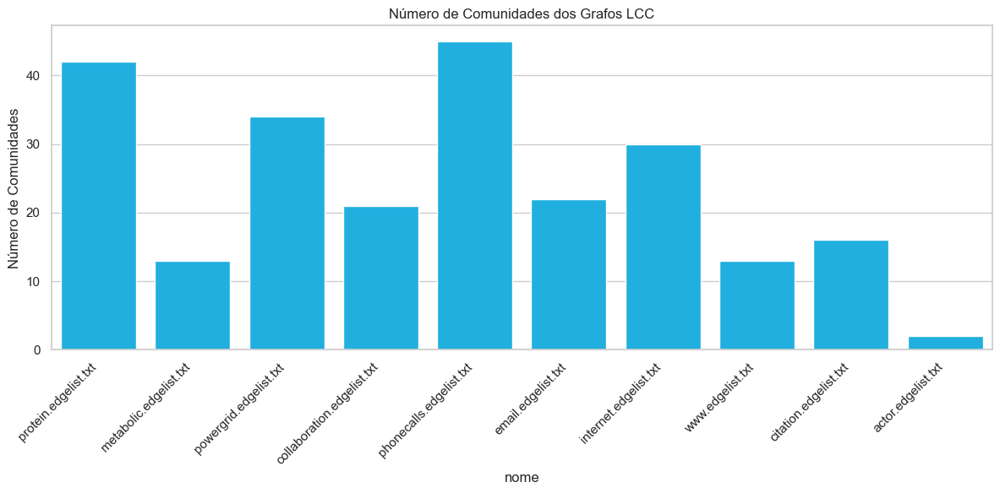

In [ ]:
# Histograma do número de comunidades dos grafos_LCC

def calcular_num_comunidades(G):
    try:
        if nx.is_connected(G):
            comunidades = list(nx.community.greedy_modularity_communities(G))
            return len(comunidades)
        else:
            maior_componente = max(nx.connected_components(G), key=len)
            G_sub = G.subgraph(maior_componente).copy()
            comunidades = list(nx.community.greedy_modularity_communities(G_sub))
            return len(comunidades)
    except Exception:
        return np.nan

num_comunidades = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    num_comunidades.append(calcular_num_comunidades(G))
    nomes_plot.append(nome)

df_comun = pd.DataFrame({
    'num_comunidades': num_comunidades,
    'nome': nomes_plot
})

plt.figure(figsize=(12, 6))
sns.barplot(data=df_comun, x='nome', y='num_comunidades', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Número de Comunidades')
plt.title('Número de Comunidades dos Grafos LCC')
plt.tight_layout()
plt.show()

Seria ótimo realizar a comparação do número de comunidades dos grafos originais e grafos do LCC para veririficar se o número de comunidades foi  preservada. mas devido ao tempo limitado, não foi possível realizar essa comparação. mas é uma coisa que levarei para os meus caos reais de pesquisa.

**Intepretações sobre o gráfico**

**powergrid** - Moderada modulariedade

**metabolic** - Baixa/moderada modulariedade

**protein** - Alta modulariedade

**phonecalss** - Alta modulariedade

**email** - Moderada modulariedade

**collaboration** - Moderada modulariedade

**internet** - Moderada modulariedade

**www** Baixa modulariedade

**Citation** - Baixa/Moderada modulariedade

**actor** - Quase nenhuma modulariedade

### 1.4.9 Modularieddade das redes

**Conceitos Importantes**
Modularidade mede a qualidade da divisão de uma rede em comunidades.

Valor positivo alto indica que há mais arestas dentro das comunidades do que seria esperado por acaso; valores próximos a zero indicam ausência de estrutura comunitária.

A modularidade é uma medida que indica a qualidade da divisão de um grafo em comunidades. Ela avalia se as arestas dentro das comunidades são mais densas do que as arestas entre as comunidades. A modularidade é calculada como a diferença entre a fração de arestas dentro das comunidades e a fração esperada de arestas dentro das comunidades, assumindo uma rede aleatória.

**Uso da técnica**
**Avaliar partições:** Medir quão boa é a divisão atual da rede em comunidades.

**Otimizar detecção de comunidades:** Muitos algoritmos (como Louvain e Leiden) usam a maximização da modularidade como critério principal.

**Comparar diferentes redes:** Permite identificar se uma rede é mais modular que outra, mesmo com tamanhos diferentes.

**Estudos em várias áreas:**

Redes sociais: medir segregação de grupos

Redes biológicas: identificar módulos funcionais

Redes de transporte: detectar sub-regiões com alta conectividade interna

**# Interpretação:**

Modularidade   Interpretação

≈ 0             Comunidades não são melhores que o acaso

0.3 − 0.5       Comunidades razoáveis

+0.5             Comunidades fortes e bem definidas

< 0             Pior que um grafo aleatório (muito raro)





In [ ]:
def analisar_modularidade(nome, LCC_reduzido):
    try:
        if nx.is_connected(LCC_reduzido):
            comunidades = list(community.greedy_modularity_communities(LCC_reduzido))
            modularidade = community.modularity(LCC_reduzido, comunidades)
            return f"\n✅ Modularidade de {nome}: {modularidade:.4f}"
        else:
            maior_componente = max(nx.connected_components(LCC_reduzido), key=len)
            LCC_sub = LCC_reduzido.subgraph(maior_componente).copy()
            comunidades = list(community.greedy_modularity_communities(LCC_sub))
            modularidade = community.modularity(LCC_sub, comunidades)
            return (
                f"\n⚠️ Modularidade de {nome}:\n"
                f"Grafo desconexo — analisando maior componente conexo\n"
                f"Modularidade: {modularidade:.4f}"
            )
    except Exception as e:
        return f"\n❌ Modularidade de {nome} — Erro ao processar: {e}"
    

# Execução em paralelo
with ThreadPoolExecutor(max_workers=10) as executor:
    futures = [
        executor.submit(analisar_modularidade, nome, LCC_reduzido)
        for nome, LCC_reduzido in zip(nomes_LCC, grafos_LCC)
    ]
    for future in as_completed(futures):
        print(future.result())



✅ Modularidade de powergrid.edgelist.txt: 0.9202

✅ Modularidade de protein.edgelist.txt: 0.7499

✅ Modularidade de phonecalls.edgelist.txt: 0.8450

✅ Modularidade de metabolic.edgelist.txt: 0.3478

✅ Modularidade de citation.edgelist.txt: 0.6494

✅ Modularidade de www.edgelist.txt: 0.8474

✅ Modularidade de internet.edgelist.txt: 0.5811

✅ Modularidade de collaboration.edgelist.txt: 0.4864

✅ Modularidade de email.edgelist.txt: 0.3330

✅ Modularidade de actor.edgelist.txt: 0.1845


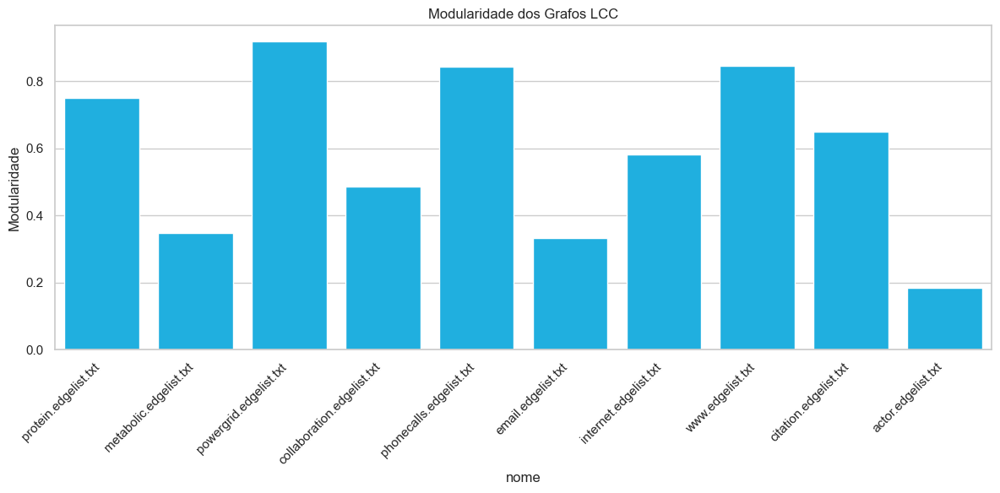

In [ ]:
# Histograma da modularidade dos grafos_LCC

def calcular_modularidade(G):
    try:
        if nx.is_connected(G):
            comunidades = list(nx.community.greedy_modularity_communities(G))
            return nx.community.modularity(G, comunidades)
        else:
            maior_componente = max(nx.connected_components(G), key=len)
            G_sub = G.subgraph(maior_componente).copy()
            comunidades = list(nx.community.greedy_modularity_communities(G_sub))
            return nx.community.modularity(G_sub, comunidades)
    except Exception:
        return np.nan

modularidades = []
nomes_plot = []

for nome, G in zip(nomes_LCC, grafos_LCC):
    modularidades.append(calcular_modularidade(G))
    nomes_plot.append(nome)

df_mod = pd.DataFrame({
    'modularidade': modularidades,
    'nome': nomes_plot
})

plt.figure(figsize=(12, 6))
sns.barplot(data=df_mod, x='nome', y='modularidade', color='deepskyblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Modularidade')
plt.title('Modularidade dos Grafos LCC')
plt.tight_layout()
plt.show()

## 1.5 Gráfico das redes 

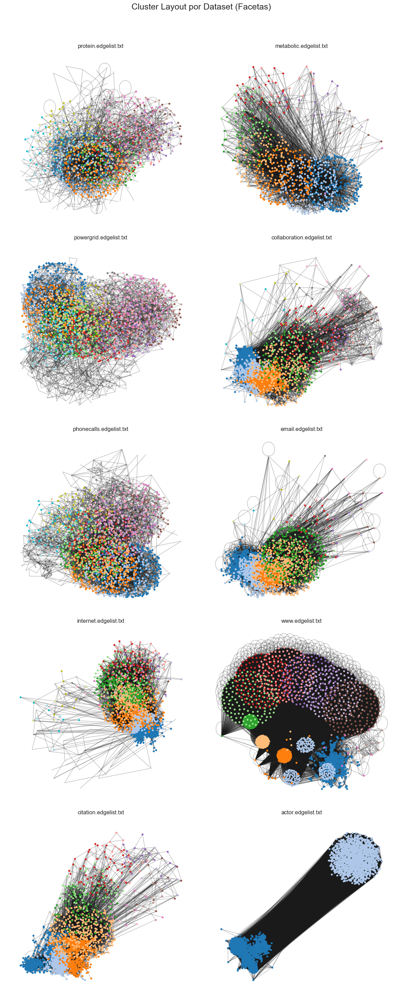

In [ ]:
# Função de plotagem com suporte a subplot utilizando Greedy Modularity Communities
# Eu criei essa função para plotar o layout dos clusters de cada grafo, utilizando
# a biblioteca NetworkX para criar os grafos e Matplotlib para plotar os grafos
# As cores dos nós são definidas por uma paleta de cores padrão do Matplotlib (tab20)
# A cor identifica a comunidade a qual o nó pertence, facilitando a visualização dos clusters.
def plot_cluster_layout(LCC_reduzido, title=None, ax=None, colors=None):
    communities = list(nx.community.greedy_modularity_communities(LCC_reduzido))
    supergraph = nx.cycle_graph(len(communities))
    superpos = nx.spring_layout(supergraph, scale=2, seed=429)
    centers = list(superpos.values())

    pos = {}
    for center, comm in zip(centers, communities):
        # Seed - Quis garantir a que disposição dos nós não iria alterar (facilitou a minha visualzação no momento que estava testando)
        # K    - Controla a distância entre os nós
        # Iterations - Controla o número de iterações do algoritmo de layout
        # aqui foi uma tentativa e erro para encontrar um bom layout
        pos.update(nx.spring_layout(LCC_reduzido.subgraph(comm), center=center, seed=1430, k=0.5, iterations=30))


    if colors is None:
        colors = plt.cm.tab20.colors

    for i, (comm, color) in enumerate(zip(communities, colors)):
        nx.draw_networkx_nodes(LCC_reduzido, pos, nodelist=comm, node_color=[color], node_size=10, ax=ax)
    nx.draw_networkx_edges(LCC_reduzido, pos, alpha=0.3, ax=ax)
    
    if ax:
        ax.set_title(title)
        ax.axis("off")

# Criar facetas para cada grafo
# Criar facetas para cada grafo (2 colunas e N linhas)
n_grafos = len(grafos_LCC)
ncols = 2
nrows = (n_grafos + 1) // 2  # Arredonda para cima

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 6 * nrows))
axes = axes.flatten()  # Transforma em vetor para facilitar o loop

for ax, nome, G in zip(axes, nomes_LCC, grafos_LCC):
    plot_cluster_layout(G, title=nome, ax=ax)

# Desativa eixos não usados (caso o número de grafos seja ímpar)
for ax in axes[n_grafos:]:
    ax.axis("off")

plt.suptitle("Cluster Layout por Dataset (Facetas)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Espaço para o suptitle
plt.show()


| Dataset           | Observação visual                                                     | Confirmação pelas métricas                                                                   |
| ----------------- | --------------------------------------------------------------------- | -------------------------------------------------------------------------------------------- |
| **protein**       | Vários grupos coloridos, conectados por poucos enlaces fortes.        | Alto nº de comunidades, alta modularidade (\~0.75), baixa densidade.                         |
| **metabolic**     | Três grandes blocos principais fortemente conectados internamente.    | Poucas comunidades (13), modularidade baixa/moderada (\~0.34).                               |
| **powergrid**     | Dois grandes grupos compactos ligados por poucas arestas.             | Modularidade muito alta (\~0.92), alto diâmetro (45), baixa densidade (\~0.001).             |
| **collaboration** | Núcleo central denso com grupos periféricos.                          | Modularidade moderada (\~0.49), densidade baixa (\~0.006), transitividade moderada (\~0.29). |
| **phonecalls**    | Estrutura esparsa com grupos bem coloridos e definidos.               | Alto nº de comunidades (45), modularidade alta (\~0.85), distância média alta (\~8.4).       |
| **email**         | Um bloco central muito denso com periferia conectada.                 | Modularidade baixa (\~0.33), densidade baixa (\~0.006) mas hubs importantes.                 |
| **internet**      | Núcleo compacto com braços periféricos esparsos.                      | Modularidade moderada (\~0.58), baixa densidade (\~0.009), distância média baixa (\~3.3).    |
| **www**           | Grande bloco denso com algumas subdivisões.                           | Alta densidade (\~0.05), alta transitividade (\~0.88), modularidade alta (\~0.85).           |
| **citation**      | Estrutura alongada, módulos conectados em cadeia.                     | Modularidade alta (\~0.65), densidade baixa (\~0.003), distância média moderada (\~4.5).     |
| **actor**         | Dois blocos massivos quase completos e altamente conectados entre si. | Baixa modularidade (\~0.18), alta densidade (\~0.2), diâmetro muito baixo (4).               |


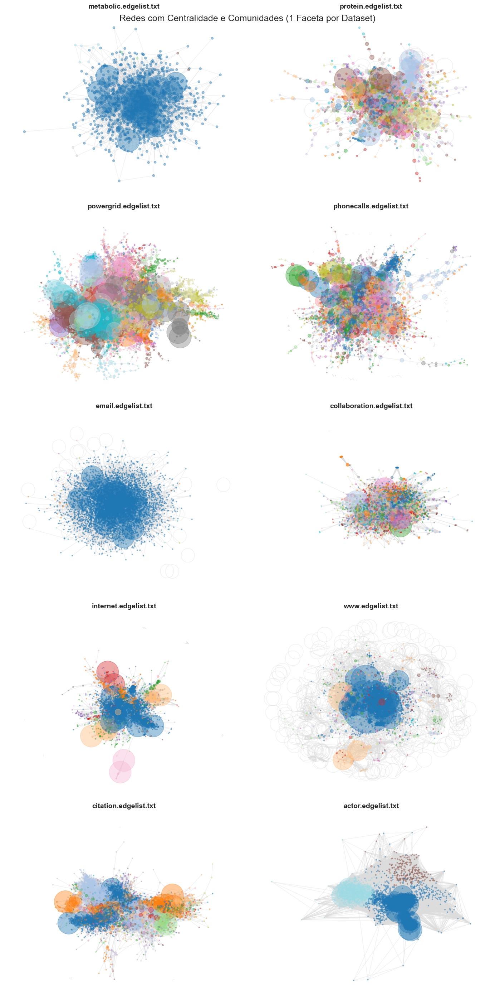

In [ ]:
n_grafos = len(grafos_LCC)
ncols = 2
nrows = (n_grafos + 1) // 2

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 6 * nrows))
axes = axes.flatten()

for i, (G, nome, ax) in enumerate(zip(grafos_LCC, nomes_LCC, axes)):
    # Centralidade
    centrality = nx.betweenness_centrality(G, k=10, endpoints=True)
    node_size = [v * 20000 for v in centrality.values()]

    # Comunidades
    lpc = nx.community.label_propagation_communities(G)
    community_index = {n: i for i, com in enumerate(lpc) for n in com}
    node_color = [community_index[n] for n in G.nodes()]

    # Layout
    pos = nx.spring_layout(G, k=0.15, seed=4572321)

    # Desenhar grafo
    nx.draw_networkx(
        G,
        pos=pos,
        ax=ax,
        with_labels=False,
        node_color=node_color,
        node_size=node_size,
        edge_color="gainsboro",
        alpha=0.4,
        cmap=plt.cm.tab20
    )

    ax.set_title(nome, fontsize=14, fontweight='bold')
    ax.axis("off")


for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.suptitle("Redes com Centralidade e Comunidades (1 Faceta por Dataset)", fontsize=18, y=0.92)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


| Dataset           | Observação visual                                           | Confirmação pelas métricas                                                                                   |
| ----------------- | ----------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------ |
| **metabolic**     | Poucos nós grandes, várias comunidades pouco conectadas.    | Baixa modularidade (\~0.34), baixa densidade, poucos hubs fortes.                                            |
| **protein**       | Muitos hubs médios distribuídos entre comunidades.          | Alta modularidade (\~0.75), muitas comunidades (42), grau médio baixo.                                       |
| **powergrid**     | Hubs relativamente pequenos, bem distribuídos nos clusters. | Alta modularidade (\~0.92), alto diâmetro (45), transitividade baixa.                                        |
| **phonecalls**    | Alguns hubs grandes conectando várias comunidades.          | Modularidade alta (\~0.85), grau médio moderado (\~4.6), alta fragmentação (45 comunidades).                 |
| **email**         | Hubs gigantes no centro conectando toda a rede.             | Baixa modularidade (\~0.33), distância média baixa (\~2.6), densidade baixa mas alta conectividade via hubs. |
| **collaboration** | Núcleo denso com vários hubs intermediários.                | Modularidade moderada (\~0.49), transitividade moderada (\~0.29).                                            |
| **internet**      | Grande núcleo com hubs externos ligando clusters menores.   | Modularidade moderada (\~0.58), densidade baixa, distância média baixa (\~3.3).                              |
| **www**           | Grande núcleo com hubs enormes, muitas ligações cruzadas.   | Alta transitividade (\~0.88), alta densidade (\~0.05), modularidade alta (\~0.85).                           |
| **citation**      | Hubs bem distribuídos conectando comunidades distintas.     | Modularidade alta (\~0.65), densidade baixa (\~0.003), distância média moderada.                             |
| **actor**         | Poucos hubs grandes, alta conectividade entre todos.        | Modularidade muito baixa (\~0.18), alta densidade (\~0.2), diâmetro muito baixo (4).                         |


# 2. Analise de um dos dataset do Albert-László Barabási 


O dataset selecionado foi powergrid.edgelist.txt

## 2.1 Quantidade de nós e de arestas do dataset powergrid.edgelist.txt

In [ ]:
# Quantidade de nós e quantidade de arrestas
for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        print(f" O {nome}tem {G.number_of_nodes()} nós, e {G.number_of_edges()} arestas")
    

 O powergrid.edgelist.txttem 4941 nós, e 6594 arestas


## 2.2 Médias dos graus do dataset powergrid.edgelist.txt

In [ ]:
# Essa metrica é importante para entender a conectividade dos nós no grafo,
# ou seja, quantas conexões cada nó tem em média. representa, em media, quantas conexões (arestas) cada nó tem com outros nós no grafo.
# A média dos graus é calculada somando o grau de todos os nós e dividindo pelo número total de nós.
for nome, G in zip(nomes_LCC, grafos):
    if "powergrid.edgelist.txt" in nome:
        graus = [d for _, d in G.degree()]
        media_graus = sum(graus) / len(graus) if graus else 0
        print(f"Média dos graus de {nome}: {media_graus}")


Média dos graus de powergrid.edgelist.txt: 2.66909532483303


## 2.3 Distribuição de graus do dataset powergrid.edgelist.txt

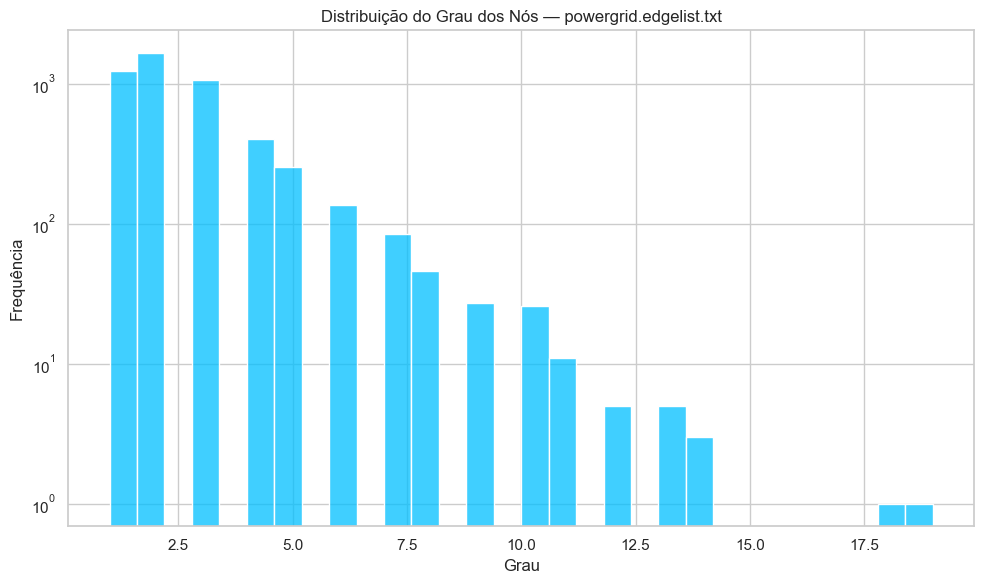

In [63]:
# Histograma da distribuição de graus do grafo "powergrid.edgelist.txt"

graus_powergrid = []
for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        graus_powergrid = [d for n, d in G.degree()]
        break

plt.figure(figsize=(10, 6))
sns.histplot(graus_powergrid, bins=30, kde=False, color='deepskyblue')
plt.title("Distribuição do Grau dos Nós — powergrid.edgelist.txt")
plt.xlabel("Grau")
plt.ylabel("Frequência")
plt.yscale('log')
plt.tight_layout()
plt.show()

**Interpretação do gráfico**

Rede homogênea e esparsa

A concentração de nós com baixo grau indica baixa heterogeneidade.

Isso é diferente de redes “livre de escala” (scale-free), onde existe uma cauda longa mais pronunciada.

Baixa presença de hubs

Poucos nós com grau alto (≥10) sugerem que não existem super-hubs centralizadores.

Isso implica que a conectividade global depende de muitos nós medianos e não de poucos nós críticos.

Topologia física restrita

Em redes elétricas reais, conexões extras (arestas) têm custo físico e de manutenção, o que limita o grau.

Essa limitação força uma estrutura quase planar e sem grandes concentrações de ligações.

Relação com a distribuição de caminhos

O predomínio de nós com baixo grau contribui para a alta distância média (~17,5) observada no histograma anterior.

Menos conexões diretas → mais saltos para alcançar nós distantes.

**Implicações:** sem hubs gigantes, a rede é mais resistente a ataques direcionados a nós de alto grau. 

**Vulnerabilidade:** falhas em nós de grau médio que atuam como “pontes” podem causar grandes desconexões regionais.

**Eficiência:** baixa, pois o tráfego precisa passar por múltiplos intermediários para chegar ao destino.


## 2.4 Comprimento do caminho médio do dataset powergrid.edgelist.txt

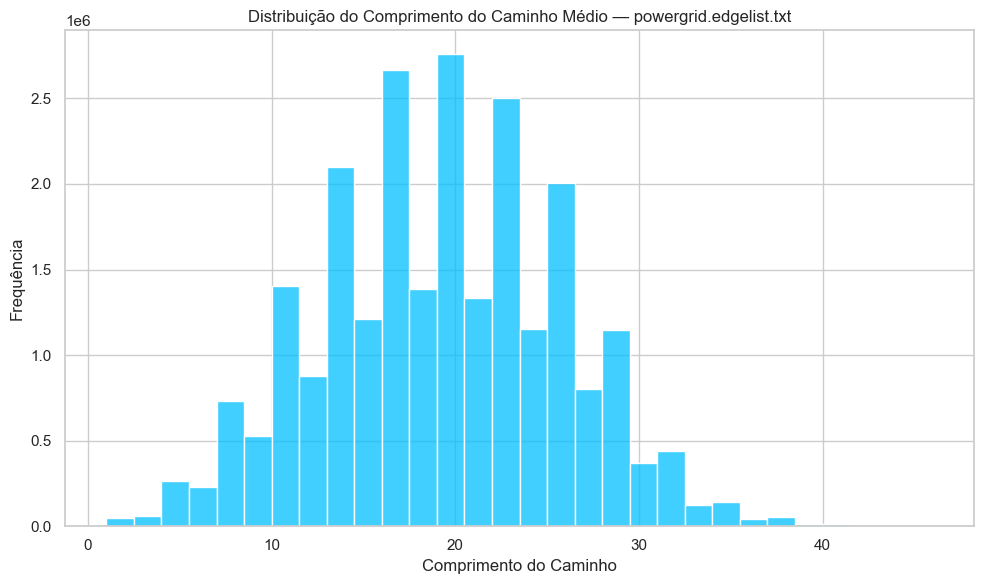

In [ ]:
for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        if not nx.is_connected(G):
            # Trabalha com o maior componente conexo
            G = G.subgraph(max(nx.connected_components(G), key=len)).copy()
        # Calcula todos os caminhos mais curtos entre pares de nós
        distancias = []
        for source, path_lengths in nx.shortest_path_length(G):
            distancias.extend(list(path_lengths.values()))
        # Remove distâncias zero (nó para ele mesmo)
        distancias = [d for d in distancias if d > 0]
        # Plot histograma
        plt.figure(figsize=(10, 6))
        sns.histplot(distancias, bins=30, kde=False, color='deepskyblue')
        plt.title('Distribuição do Comprimento do Caminho Médio — powergrid.edgelist.txt')
        plt.xlabel('Comprimento do Caminho')
        plt.ylabel('Frequência')
        plt.tight_layout()
        plt.show()

**Analise do gráfico**

Eixo X (Comprimento do Caminho): distância mínima entre pares de nós (número de arestas).

Eixo Y (Frequência): quantos pares de nós têm aquela distância.

Distribuição tem formato aproximadamente normal, centrada entre 17 e 20 passos.

Extremidades:

Caminhos curtos (<10) são raros.

Caminhos longos (>30) também são raros.

Comprimento máximo se aproxima de 40, coerente com o diâmetro da rede.

Interpretação estrutural
Rede “esticada”

A média das distâncias (~17,5) e a distribuição centrada nesse valor confirmam que a rede tem longos caminhos médios.

Isso indica baixa eficiência de transmissão ou fluxo quando comparada a redes “mundo pequeno”.

Poucos atalhos

A ausência de cauda longa na faixa de caminhos curtos sugere que há poucos hubs que encurtam distâncias.

Diferente de redes sociais ou digitais, onde muitos pares estão a 3–6 passos de distância.

Topologia física

Essa distribuição é típica de redes planejadas fisicamente, como grades elétricas, onde a ligação é restrita por geografia e custo.

Não há ligações “aleatórias” suficientes para quebrar a linearidade e criar pequenos mundos.

Robustez e vulnerabilidade

Estruturas com distâncias longas tendem a ser mais robustas a ataques aleatórios (perda de um nó não desconecta facilmente grandes blocos),
mas vulneráveis a falhas em pontos de interligação (nós que ligam regiões distantes).

## 2.5 Média das distâncias distâncias entre dois nós do dataset powergrid.edgelist.txt

In [ ]:
# Médias das distâncias entre os nós do grafo powergrid
def analisar_grafo(nome, G):
    if "powergrid.edgelist.txt" in nome:
        try:
            if nx.is_connected(G):
                medias_distancias = nx.average_shortest_path_length(G)
                print(f"\n{nome} — Grafo conexo")
                print(f"Média das distâncias entre os nós: {medias_distancias:.4f}")
            else:
                maior_componente = max(nx.connected_components(G), key=len)
                G_sub = G.subgraph(maior_componente).copy()
                medias_distancias = nx.average_shortest_path_length(G_sub)
                print(f"\n{nome} — Grafo desconexo")
                print(f"Analisando maior componente com {G_sub.number_of_nodes()} nós")
                print(f"Média das distâncias entre os nós: {medias_distancias:.4f}")
        except Exception as e:
            print(f"\n{nome} — Erro ao processar média das distâncias: {e}")


# Rodar a análise apenas para powergrid
for nome, G in zip(nomes, grafos):
    analisar_grafo(nome, G)



powergrid.edgelist.txt — Grafo conexo
Média das distâncias entre os nós: 18.9892


**1. Estrutura e conectividade**

Grafo conexo: todos os nós estão acessíveis uns aos outros sem componentes isoladas.

Grau médio ≈ 2,67: confirma que a rede é muito esparsa.

Distribuição de graus: predominância de nós com grau 2 ou 3, poucos nós acima de 10, ausência de super-hubs.

**2. Comprimento dos caminhos**
Média das distâncias = 18,99 → valor extremamente alto comparado a redes “mundo pequeno” (típicas entre 3 e 6).

Histograma de comprimentos confirma que a maioria dos pares de nós exige 15 a 25 saltos para se conectar.

Esse padrão é característico de redes espaciais planejadas, como malhas elétricas e rodoviárias, que minimizam custos mas sacrificam eficiência de alcance.

**Implicações estruturais**

**Baixa eficiência global:** difícil alcançar rapidamente nós distantes, pois não há atalhos.

**Resiliência a falhas aleatórias:** relativamente boa, já que não há dependência de poucos hubs.

**Vulnerabilidade a falhas direcionadas:** nós com grau ligeiramente acima da média podem ser críticos como “pontes” entre regiões.

## 2.6 Diametro

In [ ]:
# Diâmetro das redes
def analisar_grafo(nome, G):
    if "powergrid.edgelist.txt" in nome:
        try:
            if nx.is_connected(G):
                diametro = nx.diameter(G)
                print(f"\nDiametro de {nome}: {diametro:.4f}")
            else:
                maior_componente = max(nx.connected_components(G), key=len)
                G_sub = G.subgraph(maior_componente).copy()
                if nx.is_connected(G_sub):
                    diametro = nx.diameter(G_sub)
                    print(
                        f"\nDiametro de {nome}:\n"
                        f"Grafo desconexo — analisando maior componente conexo\n"
                        f"Diametro: {diametro:.4f}"
                    )
                else:
                    print(
                        f"\nDiametro de {nome}:\n"
                        f"Grafo desconexo — até o maior componente é desconexo\n"
                        f"Diametro não pôde ser calculado."
                    )
        except Exception as e:
            print(f"\nDiametro de {nome}:\nErro ao processar: {e}")

# Rodar a análise apenas para powergrid
for nome, G in zip(nomes, grafos):
    analisar_grafo(nome, G)



Diâmetro de powergrid.edgelist.txt: 46.0000


**1. Estrutura geral**

Tipo: Rede física espacial (rede elétrica).

**Grafo conexo:** nenhum nó está isolado.

**Grau médio:** ≈ 2,67 → rede extremamente esparsa, com predominância de nós de grau 2 e 3.

**Distribuição de graus:** não segue lei de potência; não há hubs dominantes, conectividade é relativamente homogênea.

**2. Distâncias e alcance**

**Média das distâncias:** ≈ 18,99 — muito alta, indicando baixo alcance global.

**Diametro:** 46 — maior distância mínima entre dois nós; confirma que existem pares muito distantes na rede.

**Distribuição dos comprimentos de caminho:** forma quase normal, centrada em ~19 passos.

**3. Implicações estruturais**
**Eficiência global:** baixa — a comunicação (ou fluxo) entre nós distantes exige muitos saltos.

Estrutura quase-lattice: padrão típico de redes físicas, minimizando custo de infraestrutura, mas sem atalhos.

**Robustez:** Alta contra falhas aleatórias — perda de nós de grau baixo não causa grandes danos.

**Alta vulnerabilidade a falhas direcionadas** — remoção de nós “ponte” de grau intermediário pode segmentar a rede e aumentar drasticamente o diametro.

## 2.7 Transitividade do dataset powergrid.edgelist.txt 

In [64]:
# Calcular a transitividade do grafo "powergrid.edgelist.txt"

for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        transitividade = nx.transitivity(G)
        print(f"Transitividade do grafo {nome}: {transitividade:.4f}")
        break

Transitividade do grafo powergrid.edgelist.txt: 0.1032


**Estrutura geral**

Tipo: Rede física espacial (infraestrutura elétrica).

**Conectividade:**

Grafo conexo (nenhum nó isolado).

Grau médio: ~2,67 → estrutura extremamente esparsa.

Distribuição de graus concentrada em 2–3, raros nós acima de 10.

2. Distâncias e alcance
Média das distâncias: ~18,99 → muito alta, rede pouco eficiente em alcance global.

**Diametro:** 46 → confirma presença de pares de nós extremamente distantes.

Distribuição dos comprimentos de caminho: concentrada em ~19 passos, forma quase normal.

**3. Clustering (transitividade)**
Transitividade = 0,1032 → baixa, ou seja, a probabilidade de que dois vizinhos de um nó estejam conectados é de apenas ~10%.

**Interpretação:**

Poucos triângulos na rede.

Estrutura quase-árvore em várias partes, típica de redes físicas projetadas para evitar redundâncias excessivas (custos).

4. Implicações estruturais
Baixa redundância local: poucos caminhos alternativos curtos em nível local, o que pode aumentar a vulnerabilidade a falhas de ligação específicas.

Baixa eficiência global: longos caminhos médios e poucas conexões de atalho.

Resiliência:

Boa contra falhas aleatórias (grau homogêneo).

Vulnerável a falhas em nós ou arestas “ponte”.

## 2.8 Densidade do dataset powergrid.edgelist.txt

In [65]:
# Calcular a densidade do grafo "powergrid.edgelist.txt"

for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        densidade = nx.density(G)
        print(f"Densidade do grafo {nome}: {densidade:.6f}")
        break

Densidade do grafo powergrid.edgelist.txt: 0.000540


## 2.9 Comunidades do dataset powergrid.edgelist.txt

In [66]:
# Calcular a quantidade de comunidades do grafo "powergrid.edgelist.txt"

for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        comunidades = list(nx.community.greedy_modularity_communities(G))
        print(f"Quantidade de comunidades no grafo {nome}: {len(comunidades)}")
        break

Quantidade de comunidades no grafo powergrid.edgelist.txt: 43


## 2.10 Modulariedade do dataset powergrid.edgelist.txt

In [67]:
for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        comunidades = list(nx.community.greedy_modularity_communities(G))
        modularidade = nx.community.modularity(G, comunidades)
        print(f"Modularidade do grafo {nome}: {modularidade:.4f}")
        break

Modularidade do grafo powergrid.edgelist.txt: 0.9346


## 2.11 Avaliação geral do dataset powergrid.edgelist.txt

**1. Estrutura e métricas principais**
| Métrica                  | Valor        | Interpretação                         |
| ------------------------ | ------------ | ------------------------------------- |
| Nº de nós (estimado)     | \~4.944      | Rede grande                           |
| Nº de arestas (estimado) | \~6.600      | Poucas arestas frente ao possível     |
| Densidade                | **0,000540** | Extremamente esparsa                  |
| Grau médio               | **2,67**     | Baixa conectividade                   |
| Transitividade           | **0,1032**   | Pouca redundância local               |
| Comunidades              | **43**       | Alta segmentação                      |
| Modularidade             | **0,9346**   | Estrutura modular fortemente definida |
| Média das distâncias     | **18,99**    | Alcance global baixo                  |
| Diâmetro                 | **46**       | Máxima distância muito alta           |

**2. Interpretação técnica**

Altíssima modularidade (>0,9) significa que a imensa maioria das arestas conecta nós dentro de uma mesma comunidade.

As 43 comunidades provavelmente correspondem a blocos regionais (áreas geográficas ou clusters operacionais) com pouquíssimas conexões externas.

**Essa estrutura:**

Aumenta a robustez interna de cada módulo.

Aumenta a vulnerabilidade da rede como um todo: se uma ou poucas conexões intercomunitárias caem, a rede se fragmenta rapidamente.

O diâmetro e a média das distâncias elevados confirmam que há poucos atalhos entre módulos.

**3. Perfil resumido**
Tipo: Rede física espacial altamente modular.

**Pontos fortes:**

Resistente a falhas internas (dentro das comunidades).

Estrutura previsível e fácil de mapear.

**Pontos fracos:**

Extremamente vulnerável a falhas direcionadas nas conexões entre comunidades.

Baixa eficiência global de alcance.

Pouca redundância local (transitividade baixa).

## 2.12 gráfico visual das comunidades do dataset powergrid.edgelist.txt

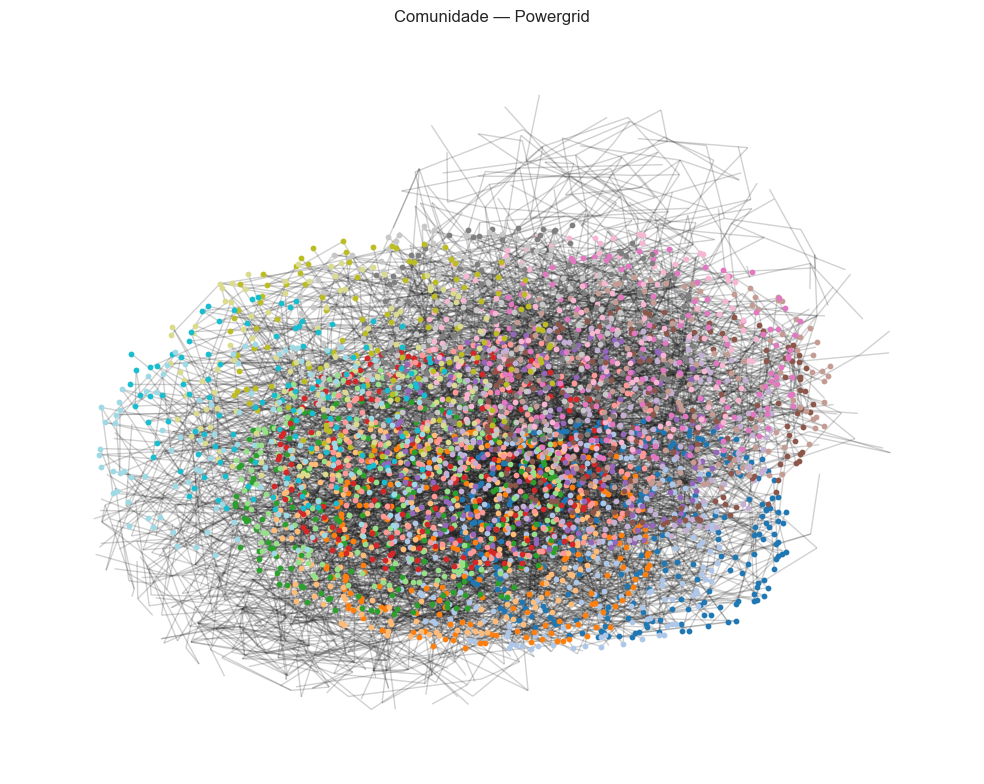

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Função de plotagem com layout modular baseado em comunidades (ex: greedy)
def plot_cluster_layout(G, nome, title=None, ax=None, colors=None):
    if "powergrid.edgelist.txt" in nome:
        # Detecta comunidades com greedy_modularity (ou troque para girvan_newman se desejar)
        communities = list(nx.community.greedy_modularity_communities(G))

        # Layout de comunidades: organiza cada comunidade ao redor de um círculo
        supergraph = nx.cycle_graph(len(communities))
        superpos = nx.spring_layout(supergraph, scale=2, seed=429)
        centers = list(superpos.values())

        pos = {}
        for center, comm in zip(centers, communities):
            pos.update(nx.spring_layout(G.subgraph(comm), center=center, seed=1430, k=0.5, iterations=30))

        # Paleta de cores
        if colors is None:
            colors = plt.cm.tab20.colors

        for i, (comm, color) in enumerate(zip(communities, colors)):
            nx.draw_networkx_nodes(G, pos, nodelist=comm, node_color=[color], node_size=10, ax=ax)
        nx.draw_networkx_edges(G, pos, alpha=0.2, ax=ax)

        if ax:
            ax.set_title(title)
            ax.axis("off")
# Procurar o grafo powergrid
for nome, G in zip(nomes, grafos):
    if "powergrid.edgelist.txt" in nome:
        fig, ax = plt.subplots(figsize=(10, 8))
        plot_cluster_layout(G, nome=nome, title="Comunidade — Powergrid", ax=ax)
        plt.tight_layout()
        plt.show()


## 2.13 Gráfico visual combinado da centralidade e comunidades do dataset powergrid.edgelist.txt

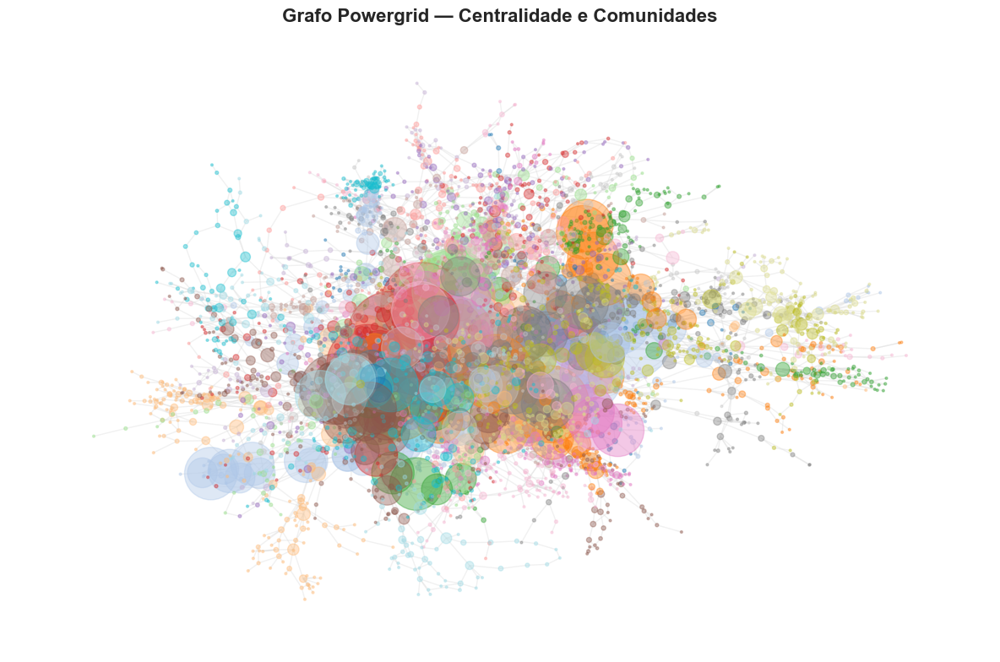

In [ ]:

for G, nome in zip(grafos, nomes):
    if "powergrid.edgelist.txt" in nome:
        fig, ax = plt.subplots(figsize=(12, 8))

        # Centralidade de intermediação
        centrality = nx.betweenness_centrality(G, k=10, endpoints=True)
        node_size = [v * 20000 for v in centrality.values()]

        # Comunidades via propagação de rótulo
        lpc = nx.community.label_propagation_communities(G)
        community_index = {n: i for i, com in enumerate(lpc) for n in com}
        node_color = [community_index[n] for n in G.nodes()]

        # Layout
        pos = nx.spring_layout(G, k=0.15, seed=4572321)

        # Desenhar grafo
        nx.draw_networkx(
            G,
            pos=pos,
            ax=ax,
            with_labels=False,
            node_color=node_color,
            node_size=node_size,
            edge_color="gainsboro",
            alpha=0.4,
            cmap=plt.cm.tab20
        )

        ax.set_title("Grafo Powergrid — Centralidade e Comunidades", fontsize=16, fontweight='bold')
        ax.axis("off")
        plt.tight_layout()
        plt.show()
        break 


# 3 Estudo de Caso: Transmissão de energia eletrica do Brasil

## 3.1 Carregamento de tratamento dos dados de transmissão de energia do Brasil

### 3.1.1 Carregamento dos dataset

In [70]:
# Carregar os datasets das transmissões, subestações e geometria dos municipios, estados e países (shp files)
df_linhas = pd.read_csv("C:/Users/victo/Documents/Ambiente/powergrid/dataset/LINHA_TRANSMISSAO.csv", sep=";")
df_sub = pd.read_csv("C:/Users/victo/Documents/Ambiente/powergrid/dataset/SUBESTACAO.csv", sep=";")


In [71]:
df_linhas.columns

Index(['id_subsistema_terminalde', 'nom_subsistema_terminalde',
       'id_subsistema_terminalpara', 'nom_subsistema_terminalpara',
       'id_estado_terminalde', 'nom_estado_de', 'id_estado_terminalpara',
       'nom_estado_para', 'nom_subestacao_de', 'nom_subestacao_para',
       'val_niveltensao_kv', 'nom_tipoderede', 'nom_tipolinha',
       'nom_agenteproprietario', 'nom_linhadetransmissao', 'cod_equipamento',
       'dat_entradaoperacao', 'dat_desativacao', 'dat_prevista',
       'val_comprimento', 'val_resistencia', 'val_reatancia', 'val_shunt',
       'val_capacoperlongasemlimit', 'val_capacoperlongacomlimit',
       'val_capacopercurtasemlimit', 'val_capacopercurtacomlimit',
       'val_capacidadeoperveraodialonga', 'val_capacidadeoperveraonoitelonga',
       'val_capacoperinvernodialonga', 'val_capacoperinvernonoitelonga',
       'val_capacoperveradiacurta', 'val_capacoperveraonoitecurta',
       'val_capacoperinvernodiacurta', 'val_capacoperinvernonoitecurta',
       'num_bar

In [72]:
#  ver as os dominios da coluna nom_tipoderede  
df_linhas["nom_tipolinha"].unique()


array(['LINHA DE TRANSMISSÃO', 'RAMAL DE LINHA', 'LINHA DC'], dtype=object)

# 3.1.2 Limpeza dos dados 

In [73]:
# Limpeza das subestações com coordenadas válidas e únicas por nome
df_sub_clean = (
    df_sub[['nom_subestacao', 'val_latitude', 'val_longitude']]
    .dropna()
    .drop_duplicates(subset='nom_subestacao')
    .set_index('nom_subestacao')
)

In [74]:
df_linhas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2330 entries, 0 to 2329
Data columns (total 37 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id_subsistema_terminalde           2330 non-null   object 
 1   nom_subsistema_terminalde          2330 non-null   object 
 2   id_subsistema_terminalpara         2282 non-null   object 
 3   nom_subsistema_terminalpara        2282 non-null   object 
 4   id_estado_terminalde               2330 non-null   object 
 5   nom_estado_de                      2330 non-null   object 
 6   id_estado_terminalpara             2282 non-null   object 
 7   nom_estado_para                    2282 non-null   object 
 8   nom_subestacao_de                  2330 non-null   object 
 9   nom_subestacao_para                2282 non-null   object 
 10  val_niveltensao_kv                 2330 non-null   float64
 11  nom_tipoderede                     2330 non-null   objec

In [75]:
# Limpeza e tratamento das linhas de transmissão
# 1. Dropar as linhas com dat_desativação <= 2024-12-31
if "dat_desativacao" in df_linhas.columns:
    df_linhas = df_linhas[df_linhas['dat_desativacao'].isna()]
#2.Dropar as linhas com nom_tipolinha == "RAMAL DE LINHA"
if "nom_tipolinha" in df_linhas.columns:
    df_linhas = df_linhas[df_linhas['nom_tipolinha'] != "RAMAL DE LINHA"]
#3.Dropar as linhas com val_comprimento <= 0
if "val_comprimento" in df_linhas.columns:
    df_linhas = df_linhas[df_linhas['val_comprimento'] > 0]
#4.Dropar as linhas com val_niveltensao_kv <= 0
if "val_niveltensao_kv" in df_linhas.columns:
    df_linhas = df_linhas[df_linhas['val_niveltensao_kv'] > 0]


In [76]:
df_linhas.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1850 entries, 0 to 2329
Data columns (total 37 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id_subsistema_terminalde           1850 non-null   object 
 1   nom_subsistema_terminalde          1850 non-null   object 
 2   id_subsistema_terminalpara         1850 non-null   object 
 3   nom_subsistema_terminalpara        1850 non-null   object 
 4   id_estado_terminalde               1850 non-null   object 
 5   nom_estado_de                      1850 non-null   object 
 6   id_estado_terminalpara             1850 non-null   object 
 7   nom_estado_para                    1850 non-null   object 
 8   nom_subestacao_de                  1850 non-null   object 
 9   nom_subestacao_para                1850 non-null   object 
 10  val_niveltensao_kv                 1850 non-null   float64
 11  nom_tipoderede                     1850 non-null   object 
 1

## 3.2 Criação do grafo de transmissão de energia do Brasil

In [77]:
# Criar grafo
transmissao_br = nx.Graph()
# Adicionar nós e arestas com geolocalização
for _, row in df_linhas.iterrows():
    origem = row['nom_subestacao_de']
    destino = row['nom_subestacao_para']

    # Adicionar nó de origem
    if not transmissao_br.has_node(origem):
        attrs = {
            'estado': row['nom_estado_de'],
            'uf': row['id_estado_terminalde'],
        }
        if origem in df_sub_clean.index:
            attrs['latitude'] = df_sub_clean.loc[origem, 'val_latitude']
            attrs['longitude'] = df_sub_clean.loc[origem, 'val_longitude']
        transmissao_br.add_node(origem, **attrs)

    # Adicionar nó de destino
    if not transmissao_br.has_node(destino):
        attrs = {
            'estado': row['nom_estado_para'],
            'uf': row['id_estado_terminalpara'],
        }
        if destino in df_sub_clean.index:
            attrs['latitude'] = df_sub_clean.loc[destino, 'val_latitude']
            attrs['longitude'] = df_sub_clean.loc[destino, 'val_longitude']
        transmissao_br.add_node(destino, **attrs)

    # Adicionar aresta
    transmissao_br.add_edge(origem, destino,
               nome_linha=row.get('nom_linhadetransmissao'),
               tensao_kV=row.get('val_niveltensao_kv'),
               comprimento_km=row.get('val_comprimento'),
               agente=row.get('nom_agenteproprietario'))


In [78]:
# Exportar como .graphml com coordenadas
data_app = 'C:/Users/victo/Documents/Ambiente/powergrid/dataset/rede_transmissao_georreferenciada.graphml'
nx.write_graphml(transmissao_br, data_app)

data_app
#Resultado
'C:/Users/victo/Documents/Ambiente/powergrid/dataset/rede_transmissao_georreferenciada.graphml'

'C:/Users/victo/Documents/Ambiente/powergrid/dataset/rede_transmissao_georreferenciada.graphml'

In [79]:

transmissao_br = nx.read_graphml("C:/Users/victo/Documents/Ambiente/powergrid/dataset/rede_transmissao_georreferenciada.graphml")

# Ver os atributos dos nós
print("Atributos dos nós:")
print(list(next(iter(transmissao_br.nodes(data=True)))[1].keys()))

# Ver os atributos das arestas
print("\nAtributos das arestas:")
print(list(next(iter(transmissao_br.edges(data=True)))[2].keys()))


Atributos dos nós:
['estado', 'uf', 'latitude', 'longitude']

Atributos das arestas:
['nome_linha', 'tensao_kV', 'comprimento_km', 'agente']


## 3.3 Criação da função para calcular todas as métricas do dataset Transmissão de energia elétrica do Brasil

In [80]:
# Analise do grafo das transmissões e subestações
# 1. número de nós (subestações) e arrestas (transmissão) - Verifica a complexidade da rede
# 2. média do comprimento das arestas (transmissão) - Verifica a extensão da rede
# 3. estatisticas do grau dos nós (subestação) Média, mediana, desvio padrão, grau máximo e mínimo
# 4. estatisticas das arrestas (transmissão) Média, mediana, desvio padrão, arresta máxima máxima e mínima
# 5. Transitividade - Verifica a conectividade local
# 6. Diametro - Verifica a extensão da rede
# 7. Densidade - Verifica a conectividade global
# 8. Número de comunidades - Verifica a modularidade da rede
# 9. Número de clusters - Verifica a modularidade da rede
# 10. modularidade - Verifica a modularidade da rede
# 11. Médias das distâncias - Verifica a conectividade global
# 12. distribuição de grau - Verifica a distribuição dos nós
# Reimportando bibliotecas necessárias após reset

# Função para calcular todas as métricas de um grafo G com nome associado
def analisar_grafo(transmissao_br, nome, atributo_comprimento='comprimento_km', atributo_peso='tensao_kV'):
    resultado = {'nome': nome}

    # 1. Número de nós e arestas
    resultado['n_nos'] = transmissao_br.number_of_nodes()
    resultado['n_arestas'] = transmissao_br.number_of_edges()

    # 2. Comprimento das arestas (se existir)
    
    comprimentos = [d[atributo_comprimento] for _, _, d in transmissao_br.edges(data=True) if atributo_comprimento in d]
    if comprimentos:

        resultado['media_comprimento'] = np.mean(comprimentos)
        resultado['mediana_comprimento'] = np.median(comprimentos)
        resultado['desvio_comprimento'] = np.std(comprimentos)
        resultado['comprimento_min'] = np.min(comprimentos)
        resultado['comprimento_max'] = np.max(comprimentos)
    else:
        resultado['media_comprimento'] = resultado['mediana_comprimento'] = resultado['desvio_comprimento'] = None
        resultado['comprimento_min'] = resultado['comprimento_max'] = None

    # 3. Estatísticas do grau
    graus = [d for _, d in transmissao_br.degree()]
    resultado['grau_medio'] = np.mean(graus)
    resultado['grau_mediana'] = np.median(graus)
    resultado['grau_desvio'] = np.std(graus)
    resultado['grau_min'] = np.min(graus)
    resultado['grau_max'] = np.max(graus)

    # 4. Estatísticas dos pesos (se houver)
    pesos = [d[atributo_peso] for _, _, d in transmissao_br.edges(data=True) if atributo_peso in d]
    if pesos:
        resultado['peso_medio'] = np.mean(pesos)
        resultado['peso_mediana'] = np.median(pesos)
        resultado['peso_desvio'] = np.std(pesos)
        resultado['peso_min'] = np.min(pesos)
        resultado['peso_max'] = np.max(pesos)
    else:
        resultado['peso_medio'] = resultado['peso_mediana'] = resultado['peso_desvio'] = None
        resultado['peso_min'] = resultado['peso_max'] = None

    # 5. Transitividade
    resultado['transitividade'] = nx.transitivity(transmissao_br)

    # 6. Diametro
    if nx.is_connected(transmissao_br):
        resultado['diametro'] = nx.diameter(transmissao_br)
    else:
        transmissao_brC = max(nx.connected_components(transmissao_br), key=len)
        resultado['diametro'] = nx.diameter(transmissao_br.subgraph(transmissao_brC))

    # 7. Densidade
    resultado['densidade'] = nx.density(transmissao_br)

    # 8. Comunidades e modularidade
    try:
        comunidades = list(nx.community.greedy_modularity_communities(transmissao_br))
        resultado['n_comunidades'] = len(comunidades)
        resultado['modularidade'] = nx.community.modularity(transmissao_br, comunidades)
    except:
        resultado['n_comunidades'] = None
        resultado['modularidade'] = None

    # 9. Número de clusters (componentes conexos)
    resultado['n_clusters'] = nx.number_connected_components(transmissao_br)

    # 10. Média das distâncias (peso se houver comprimento)
    try:
        if nx.is_connected(transmissao_br):
            resultado['media_distancia'] = nx.average_shortest_path_length(transmissao_br, weight=atributo_comprimento)
        else:
            transmissao_brC = max(nx.connected_components(transmissao_br), key=len)
            sub = transmissao_br.subgraph(transmissao_brC).copy()
            resultado['media_distancia'] = nx.average_shortest_path_length(sub, weight=atributo_comprimento)
    except:
        resultado['media_distancia'] = None

    return resultado

In [81]:
analisar_grafo(transmissao_br, "nome", atributo_comprimento='comprimento_km', atributo_peso='tensao_kV')

{'nome': 'nome',
 'n_nos': 854,
 'n_arestas': 1290,
 'media_comprimento': np.float64(98.11712792248062),
 'mediana_comprimento': np.float64(65.565),
 'desvio_comprimento': np.float64(140.94751566286476),
 'comprimento_min': np.float64(0.01),
 'comprimento_max': np.float64(2518.0),
 'grau_medio': np.float64(3.021077283372365),
 'grau_mediana': np.float64(2.0),
 'grau_desvio': np.float64(2.1500015273942883),
 'grau_min': np.int64(1),
 'grau_max': np.int64(13),
 'peso_medio': np.float64(327.2248062015504),
 'peso_mediana': np.float64(230.0),
 'peso_desvio': np.float64(124.84289291659397),
 'peso_min': np.float64(230.0),
 'peso_max': np.float64(800.0),
 'transitividade': 0.10805500982318271,
 'diametro': 24,
 'densidade': 0.0035417084213040626,
 'n_comunidades': 20,
 'modularidade': 0.8329914067664204,
 'n_clusters': 2,
 'media_distancia': 1424.5278349249984}

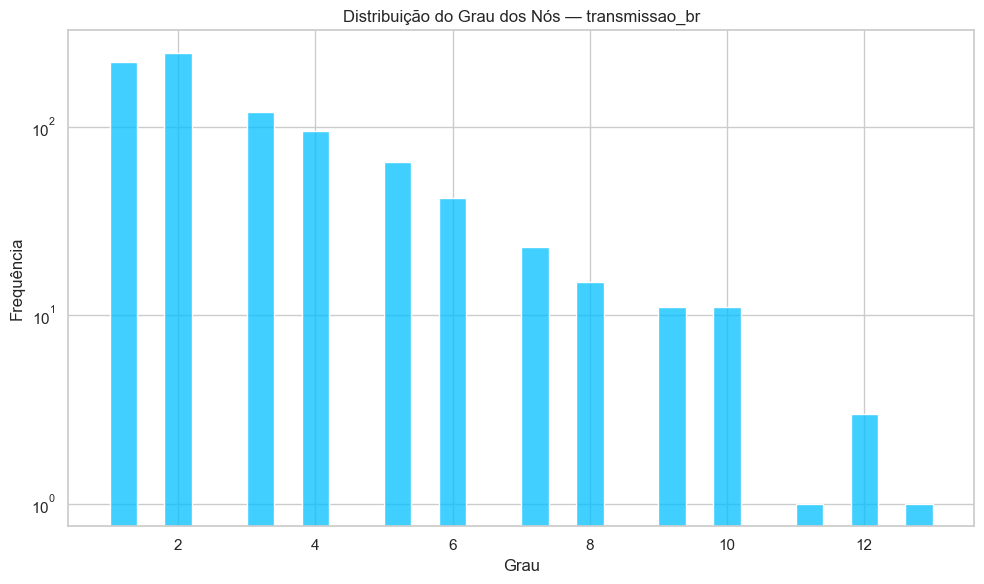

In [91]:
graus_transmissao = [d for n, d in transmissao_br.degree()]
plt.figure(figsize=(10, 6))
sns.histplot(graus_transmissao, bins=30, kde=False, color='deepskyblue')
plt.title("Distribuição do Grau dos Nós — transmissao_br")
plt.xlabel("Grau")
plt.ylabel("Frequência")
plt.yscale('log')
plt.tight_layout()
plt.show()

## 3.4 Analise da rede de transmissão de energia do Brasil


1️⃣ **Estrutura geral**

**Nós (subestações):** 854

**Arestas (linhas de transmissão):** 1290

**Densidade:** 0,00354 extremamente esparsa.

**Transitividade:** 0,108 baixa, mostrando que poucas subestações formam triângulos (circuitos redundantes locais). A redundância estrutural é limitada.

**Número de comunidades:** 20 a rede é bem segmentada regionalmente.

**Modularidade** alta 0,833 indica que as comunidades são fortemente conectadas internamente e pouco conectadas externamente, coerente com a divisão em sistemas regionais/interconectados.

2️⃣ **Conectividade e robustez**
**Grau médio** 3,02 cada subestação conecta-se, em média, a 3 outras.

**Distribuição de graus**: Forte presença de nós de grau 1 e 2 (terminais e pequenos ramais de ligação).

**Poucos hubs de alto grau** até grau 13 que funcionam como pontos críticos — provavelmente subestações de grande porte ou interconexões regionais.


**Diâmetro**: 24 a maior distância geodésica entre duas subestações é grande, sinal de que caminhos físicos podem ser longos.

**Média das distâncias:** 1424,53 km → mostra que, em média, a conexão física entre subestações exige grandes distâncias — reflexo da dimensão territorial brasileira.

3️⃣ **Comprimento e peso das linhas**

Comprimento médio: 98,12 km (mediana: 65,56 km) → maioria das linhas é de médio alcance.

Comprimento máximo: 2518 km → linhas troncais de grande porte que interligam regiões distantes.

Peso médio (tensão): 327,22 kV (mediana: 230 kV)

Mínimo: 230 kV

Máximo: 800 kV → presentes nas linhas de ultra-alta tensão usadas para longas distâncias.

4️⃣ **Vulnerabilidade e risco**

O baixo grau médio, combinado com alta modularidade, sugere que:

A rede pode ser vulnerável à falha de poucos nós centrais (hubs).

Danos a linhas específicas entre comunidades podem provocar isolamento regional.

**Baixa transitividade** pouca redundância de caminhos alternativos.

O fato de ter apenas 2 clusters principais pode indicar duas grandes componentes mais interligadas, com subestruturas menores (comunidades).

5️⃣ **Interpretação prática para operação do sistema**

**Planejamento de expansão** priorizar ligações redundantes entre comunidades para reduzir vulnerabilidade.

**Manutenção preventiva** monitorar hubs de grau alto e linhas muito longas de alta tensão, pois sua falha tem grande impacto.

**Segurança energética** fortalecer interligações entre comunidades para reduzir o risco de apagões regionais.

## 3.5 Simulação de fragilidade da rede de transmissão de energia do Brasil

In [92]:

def simular_fragilidade_por_remocao(transmissao_br, metodo='grau', passo=0.01, plotar=True):
    """
    Simula a fragilidade de uma rede removendo nós e observa o tamanho da LCC.

    metodo: 'grau', 'betweenness' ou 'aleatorio'
    passo: proporção de nós a remover por iteração (ex: 0.01 = 1%)
    """
    transmissao_br_copia = transmissao_br.copy()
    n_nos = transmissao_br.number_of_nodes()
    num_passos = int(1 / passo)
    proporcoes_removidas = []
    tamanhos_LCC = []

    for i in range(num_passos):
        # Salva proporção removida
        proporcao = i * passo
        proporcoes_removidas.append(proporcao)

        # Calcula LCC atual
        if nx.is_connected(transmissao_br_copia):
            LCC = transmissao_br_copia
        else:
            LCC = transmissao_br_copia.subgraph(max(nx.connected_components(transmissao_br_copia), key=len)).copy()
        tamanhos_LCC.append(LCC.number_of_nodes())

        # Define os nós a remover
        if metodo == 'grau':
            alvo = sorted(transmissao_br_copia.degree, key=lambda x: x[1], reverse=True)
        elif metodo == 'betweenness':
            bc = nx.betweenness_centrality(transmissao_br_copia)
            alvo = sorted(bc.items(), key=lambda x: x[1], reverse=True)
        else:  
            alvo = list(transmissao_br_copia.nodes())
            random.shuffle(alvo)

        # Remove parte dos nós
            # Remove parte dos nós
        n_remover = int(passo * n_nos)
        if metodo in ['grau', 'betweenness']:
            remover = [n for n, _ in alvo[:n_remover]]
        else:  # aleatório
            remover = alvo[:n_remover]

        transmissao_br_copia.remove_nodes_from(remover)

        if transmissao_br_copia.number_of_nodes() == 0:
            break

    if plotar:
        plt.figure(figsize=(8, 5))
        plt.plot(proporcoes_removidas, tamanhos_LCC, marker='o')
        plt.title(f"Fragilidade da rede ({metodo})")
        plt.xlabel("Proporção de nós removidos")
        plt.ylabel("Tamanho da rede")
        plt.grid(True)
        plt.show()

    return proporcoes_removidas, tamanhos_LCC


### 3.5.1 Frangilidade da rede de transmissão de energia elétrica do Brasil pela remoção de nós aleatória

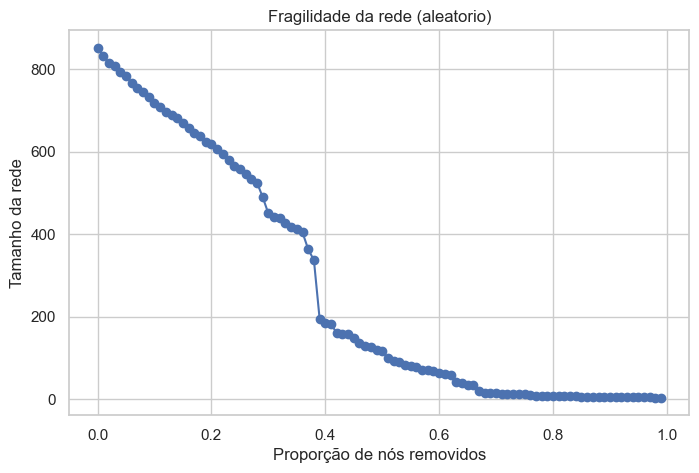

([0.0,
  0.01,
  0.02,
  0.03,
  0.04,
  0.05,
  0.06,
  0.07,
  0.08,
  0.09,
  0.1,
  0.11,
  0.12,
  0.13,
  0.14,
  0.15,
  0.16,
  0.17,
  0.18,
  0.19,
  0.2,
  0.21,
  0.22,
  0.23,
  0.24,
  0.25,
  0.26,
  0.27,
  0.28,
  0.29,
  0.3,
  0.31,
  0.32,
  0.33,
  0.34,
  0.35000000000000003,
  0.36,
  0.37,
  0.38,
  0.39,
  0.4,
  0.41000000000000003,
  0.42,
  0.43,
  0.44,
  0.45,
  0.46,
  0.47000000000000003,
  0.48,
  0.49,
  0.5,
  0.51,
  0.52,
  0.53,
  0.54,
  0.55,
  0.56,
  0.5700000000000001,
  0.58,
  0.59,
  0.6,
  0.61,
  0.62,
  0.63,
  0.64,
  0.65,
  0.66,
  0.67,
  0.68,
  0.6900000000000001,
  0.7000000000000001,
  0.71,
  0.72,
  0.73,
  0.74,
  0.75,
  0.76,
  0.77,
  0.78,
  0.79,
  0.8,
  0.81,
  0.8200000000000001,
  0.8300000000000001,
  0.84,
  0.85,
  0.86,
  0.87,
  0.88,
  0.89,
  0.9,
  0.91,
  0.92,
  0.93,
  0.9400000000000001,
  0.9500000000000001,
  0.96,
  0.97,
  0.98,
  0.99],
 [852,
  831,
  816,
  807,
  793,
  784,
  766,
  754,
  745,
  

In [94]:
# Remoção dos nós aleatoriamente
simular_fragilidade_por_remocao(transmissao_br, metodo='aleatorio')

Esse gráfico de fragilidade da rede (remoção aleatória de nós) mostra que:

1️⃣ **Resistência moderada a remoções aleatórias**

No início, a rede perde tamanho de forma gradual quando até ~30% dos nós são removidos aleatoriamente.

Isso indica uma certa robustez contra falhas aleatórias, comum em redes de infraestrutura física — a maioria dos nós tem baixo grau e não é crítica para manter a conectividade global.

2️⃣ **Ponto crítico (~40–50% de remoção)**

Entre 40% e 50% de nós removidos, há uma queda brusca no tamanho da maior componente da rede.

Esse ponto é conhecido como limiar de percolação: a rede deixa de ser funcional como sistema interconectado e se fragmenta em pequenos componentes isolados.

3️⃣ **Colapso total**

Após 50% de remoção, a rede já está altamente fragmentada, e restam apenas componentes pequenos e isolados.

A queda final é mais lenta porque já não existe mais uma rede gigante a ser destruída.

4️⃣ **Interpretação prática**

Em falhas aleatórias (por exemplo, manutenção não planejada ou problemas locais), o sistema de transmissão brasileiro consegue manter uma estrutura operacional até certo nível de dano (≈ 40% dos nós).

Porém, quando o dano excede esse ponto, a conectividade colapsa rapidamente.

Em ataques direcionados a hubs, o colapso seria muito mais rápido, porque os nós de alto grau são responsáveis por grande parte da conectividade global.

### 3.5.2 Frangilidade da rede de transmissão de energia eletrica do Brasil pela remoção de nós com maior centralidade

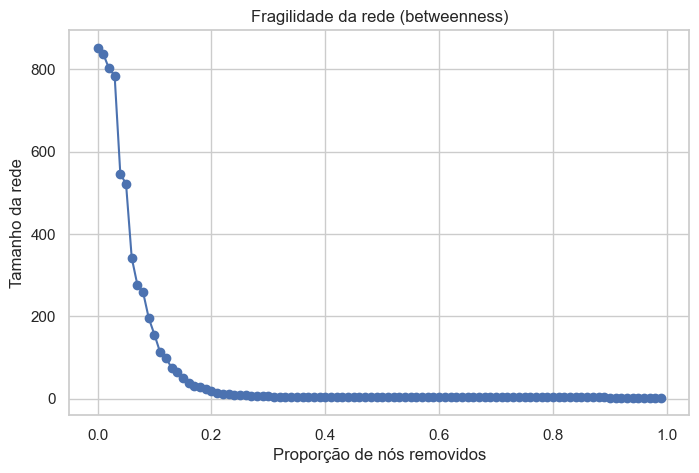

([0.0,
  0.01,
  0.02,
  0.03,
  0.04,
  0.05,
  0.06,
  0.07,
  0.08,
  0.09,
  0.1,
  0.11,
  0.12,
  0.13,
  0.14,
  0.15,
  0.16,
  0.17,
  0.18,
  0.19,
  0.2,
  0.21,
  0.22,
  0.23,
  0.24,
  0.25,
  0.26,
  0.27,
  0.28,
  0.29,
  0.3,
  0.31,
  0.32,
  0.33,
  0.34,
  0.35000000000000003,
  0.36,
  0.37,
  0.38,
  0.39,
  0.4,
  0.41000000000000003,
  0.42,
  0.43,
  0.44,
  0.45,
  0.46,
  0.47000000000000003,
  0.48,
  0.49,
  0.5,
  0.51,
  0.52,
  0.53,
  0.54,
  0.55,
  0.56,
  0.5700000000000001,
  0.58,
  0.59,
  0.6,
  0.61,
  0.62,
  0.63,
  0.64,
  0.65,
  0.66,
  0.67,
  0.68,
  0.6900000000000001,
  0.7000000000000001,
  0.71,
  0.72,
  0.73,
  0.74,
  0.75,
  0.76,
  0.77,
  0.78,
  0.79,
  0.8,
  0.81,
  0.8200000000000001,
  0.8300000000000001,
  0.84,
  0.85,
  0.86,
  0.87,
  0.88,
  0.89,
  0.9,
  0.91,
  0.92,
  0.93,
  0.9400000000000001,
  0.9500000000000001,
  0.96,
  0.97,
  0.98,
  0.99],
 [852,
  837,
  802,
  784,
  545,
  522,
  342,
  276,
  258,
  

In [93]:
# Remoção dos nós com base o caminho mais curto
simular_fragilidade_por_remocao(transmissao_br, metodo='betweenness')


Esse gráfico de **fragilidade da rede pela remoção de nós com maior betweenness centrality** mostra um comportamento **drasticamente diferente** do cenário aleatório:


1️⃣ **Vulnerabilidade extrema a ataques direcionados**

A remoção de apenas ~5% dos nós mais centrais já reduz a maior componente da rede de ~850 nós para menos de 200.

Com 10% dos nós mais centrais removidos, a rede praticamente colapsa, restando apenas pequenos fragmentos isolados.

2️⃣ **Por que isso acontece?**

Nós com alta betweenness são cruciais para o transporte de energia, pois funcionam como pontes entre diferentes regiões da rede.

A perda desses nós rompe os principais corredores de transmissão, isolando sub-redes inteiras e interrompendo fluxos de energia.

3️⃣ **Comparação com falhas aleatórias**

| Cenário         | % de nós removidos até colapso | Característica principal                                          |
| --------------- | ------------------------------ | ----------------------------------------------------------------- |
| **Aleatório**   | \~40–50%                       | Rede robusta contra falhas não direcionadas                       |
| **Betweenness** | \~10%                          | Rede altamente vulnerável a ataques intencionais nos nós críticos |


4️⃣ **Implicações para o sistema elétrico**

A estrutura atual é **resiliente a falhas locais não planejadas**, mas **altamente vulnerável a falhas coordenadas** que atinjam nós estratégicos.

Isso sugere que, para aumentar a segurança, seria importante:

Criar **rotas redundantes** para reduzir dependência desses pontos críticos.

Investir em **proteção física e digital** dos nós de alta betweenness.

Implementar **monitoramento contínuo** para detecção precoce de anomalias nesses nós.

### 3.5.3 Fragilidade da rede de transmissão de energia do Brasil pela remoção dos nós de maior grau

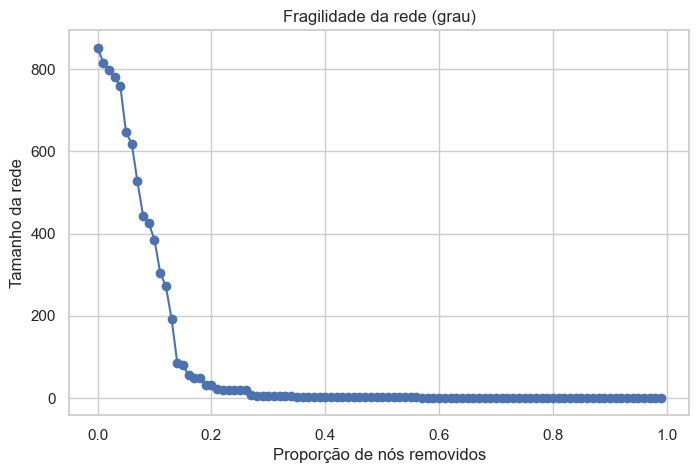

([0.0,
  0.01,
  0.02,
  0.03,
  0.04,
  0.05,
  0.06,
  0.07,
  0.08,
  0.09,
  0.1,
  0.11,
  0.12,
  0.13,
  0.14,
  0.15,
  0.16,
  0.17,
  0.18,
  0.19,
  0.2,
  0.21,
  0.22,
  0.23,
  0.24,
  0.25,
  0.26,
  0.27,
  0.28,
  0.29,
  0.3,
  0.31,
  0.32,
  0.33,
  0.34,
  0.35000000000000003,
  0.36,
  0.37,
  0.38,
  0.39,
  0.4,
  0.41000000000000003,
  0.42,
  0.43,
  0.44,
  0.45,
  0.46,
  0.47000000000000003,
  0.48,
  0.49,
  0.5,
  0.51,
  0.52,
  0.53,
  0.54,
  0.55,
  0.56,
  0.5700000000000001,
  0.58,
  0.59,
  0.6,
  0.61,
  0.62,
  0.63,
  0.64,
  0.65,
  0.66,
  0.67,
  0.68,
  0.6900000000000001,
  0.7000000000000001,
  0.71,
  0.72,
  0.73,
  0.74,
  0.75,
  0.76,
  0.77,
  0.78,
  0.79,
  0.8,
  0.81,
  0.8200000000000001,
  0.8300000000000001,
  0.84,
  0.85,
  0.86,
  0.87,
  0.88,
  0.89,
  0.9,
  0.91,
  0.92,
  0.93,
  0.9400000000000001,
  0.9500000000000001,
  0.96,
  0.97,
  0.98,
  0.99],
 [852,
  816,
  799,
  780,
  759,
  646,
  619,
  527,
  444,
  

In [ ]:
# Remoção dos nós com base no grau 
# remove os nós mais conectados primeiro 
simular_fragilidade_por_remocao(transmissao_br, metodo='grau')



Esse gráfico mostra a fragilidade da rede quando removemos nós com maior grau (número de conexões diretas).

1️⃣ **Comportamento observado**

**Remoção de apenas 5% dos nós mais conectados** já reduz a maior componente de ~850 para ~400 nós.

**Com cerca de 15% dos nós removidos**, a rede entra em colapso total, fragmentando-se em pequenas partes.

O impacto é rápido, mas **menos abrupto** do que no caso da betweenness centrality, onde 10% dos nós já destruíam quase toda a rede.

2️⃣ **Comparação com outros cenários**
| Estratégia de remoção | % de nós até colapso | Observação                  |
| --------------------- | -------------------- | --------------------------- |
| **Aleatória**         | \~40–50%             | Rede bastante resiliente    |
| **Por grau**          | \~15%                | Alta vulnerabilidade a hubs |
| **Por betweenness**   | \~10%                | Vulnerabilidade extrema     |


3️⃣ **Interpretação**
Os nós com maior grau atuam como **hubs** que conectam várias partes do sistema de transmissão.

Remover esses nós significa **perder pontos centrais de distribuição de energia**, isolando diversas áreas rapidamente.

No entanto, a rede ainda é **ligeiramente mais resistente** a ataques por grau do que por betweenness, porque:

Nem todo nó altamente conectado é necessariamente um ponto crítico de ligação entre regiões.

Alguns hubs estão localizados em áreas redundantes.

4️⃣ **Implicações para o sistema elétrico**
O sistema deve considerar **estratégias de redundância em torno dos hubs** para evitar que a perda de um deles cause isolamento de regiões inteiras.

Uma boa prática seria **restringir a dependência excessiva de poucos nós** para manter a robustez.

### 3.5.4 Simulação da remoção dos nós no maps

In [ ]:
def visualizar_fragilidade_mpl(transmissao_br_original, gdf_fundo, metodo='grau', passo=0.1, salvar=False, pasta="figs_fragilidade"):
    """
    Visualiza geograficamente a fragilidade da rede com matplotlib + geopandas.
    """
    import os
    os.makedirs(pasta, exist_ok=True)

    transmissao_br = transmissao_br_original.copy()
    n_nos = transmissao_br.number_of_nodes()
    num_passos = int(1 / passo)

    # Detectar comunidades (para cores dos nós ativos)
    comunidades = list(nx.community.greedy_modularity_communities(transmissao_br_original))
    comunidade_por_no = {n: i for i, com in enumerate(comunidades) for n in com}
    cmap = cm.get_cmap('tab20', len(comunidades))
    norm = mcolors.Normalize(vmin=0, vmax=len(comunidades) - 1)

    # Lista de nós ordenados para remoção
    if metodo == 'grau':
        alvo = sorted(transmissao_br.degree, key=lambda x: x[1], reverse=True)
    elif metodo == 'betweenness':
        bc = nx.betweenness_centrality(transmissao_br)
        alvo = sorted(bc.items(), key=lambda x: x[1], reverse=True)
    else:  # aleatório
        alvo = list(transmissao_br.nodes())
        random.shuffle(alvo)

    nos_removidos = set()

    for i in range(num_passos + 1):
        fig, ax = plt.subplots(figsize=(10, 10))

        # Proporção de nós removidos até agora
        n_remover = int(passo * n_nos)
        novos_removidos = [n for n, _ in alvo[:n_remover * i]]
        nos_removidos = set(novos_removidos)

        # PLOT BASE: fundo cartográfico (Brasil, estados, etc.)
        gdf_fundo.plot(ax=ax, color='white', edgecolor='gray', linewidth=0.5)

        # PLOT NÓS
        geometria_nos = []
        cores_nos = []
        for n, data in transmissao_br_original.nodes(data=True):
            if 'latitude' not in data or 'longitude' not in data:
                continue
            pt = Point(data['longitude'], data['latitude'])
            geometria_nos.append(pt)
            if n in nos_removidos:
                cores_nos.append('black')
            else:
                comunidade = comunidade_por_no.get(n, -1)
                cor_rgb = cmap(norm(comunidade)) if comunidade >= 0 else (0.5, 0.5, 0.5, 1)
                cores_nos.append(mcolors.to_hex(cor_rgb))

        gdf_nos = gpd.GeoDataFrame(geometry=geometria_nos, crs="EPSG:4326")
        gdf_nos.plot(ax=ax, color=cores_nos, markersize=10, zorder=2)

        # PLOT ARESTAS ENTRE NÓS ATIVOS
        linhas = []
        for u, v in transmissao_br_original.edges():
            if u in nos_removidos or v in nos_removidos:
                continue
            u_data = transmissao_br_original.nodes[u]
            v_data = transmissao_br_original.nodes[v]
            if 'latitude' in u_data and 'longitude' in u_data and 'latitude' in v_data and 'longitude' in v_data:
                linha = LineString([
                    (u_data['longitude'], u_data['latitude']),
                    (v_data['longitude'], v_data['latitude'])
                ])
                linhas.append(linha)

        gdf_linhas = gpd.GeoDataFrame(geometry=linhas, crs="EPSG:4326")
        if not gdf_linhas.empty:
            gdf_linhas.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.6, zorder=1)

        # TÍTULO
        prop_remov = i * passo * 100
        ax.set_title(f"Fragilidade da Rede ({metodo}) — {prop_remov:.0f}% dos nós removidos", fontsize=14)
        ax.axis("off")

        if salvar:
            figpath = f"{pasta}/fragilidade_{metodo}_{int(prop_remov)}pct.png"
            plt.savefig(figpath, dpi=300)
        plt.show()


Conforme os nós são removidos os nós são coloridos com a cor preta

C:\Users\victo\AppData\Local\Temp\ipykernel_6408\2383465863.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(comunidades))


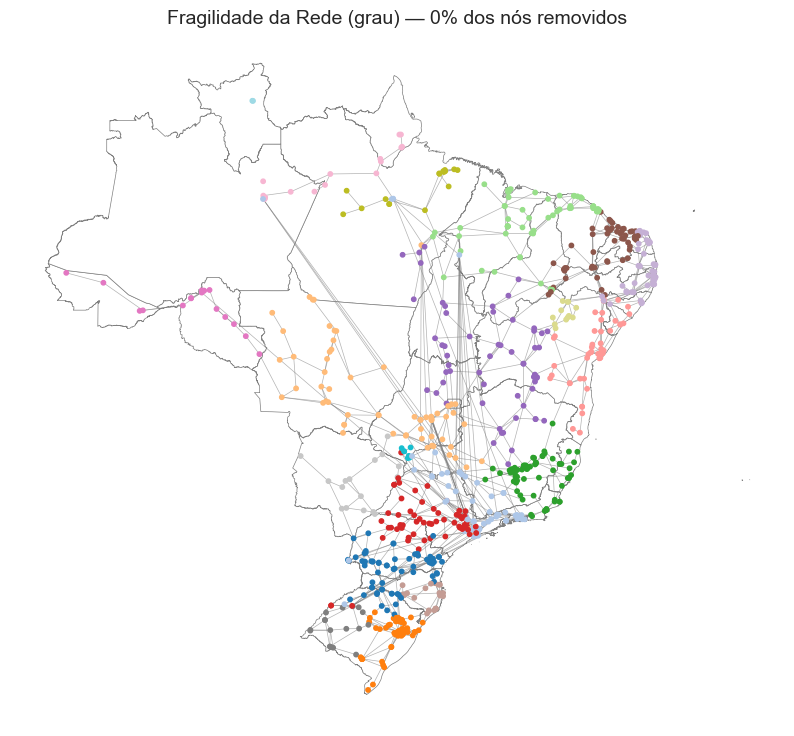

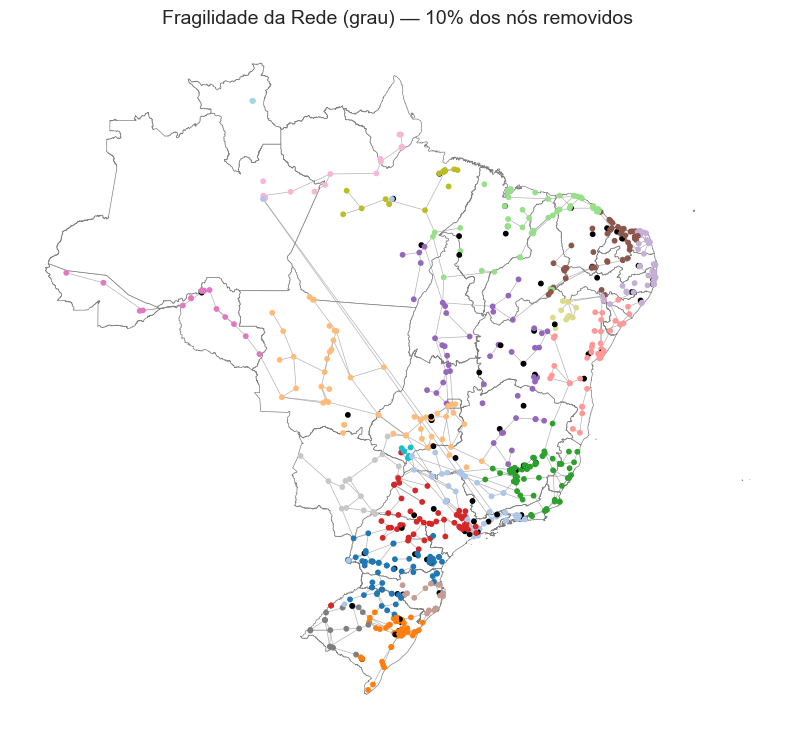

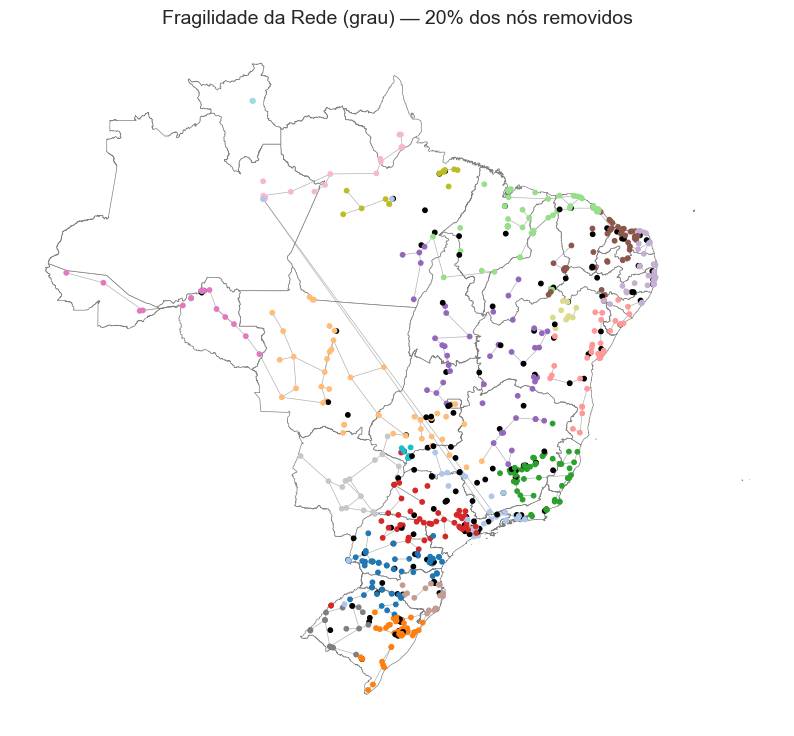

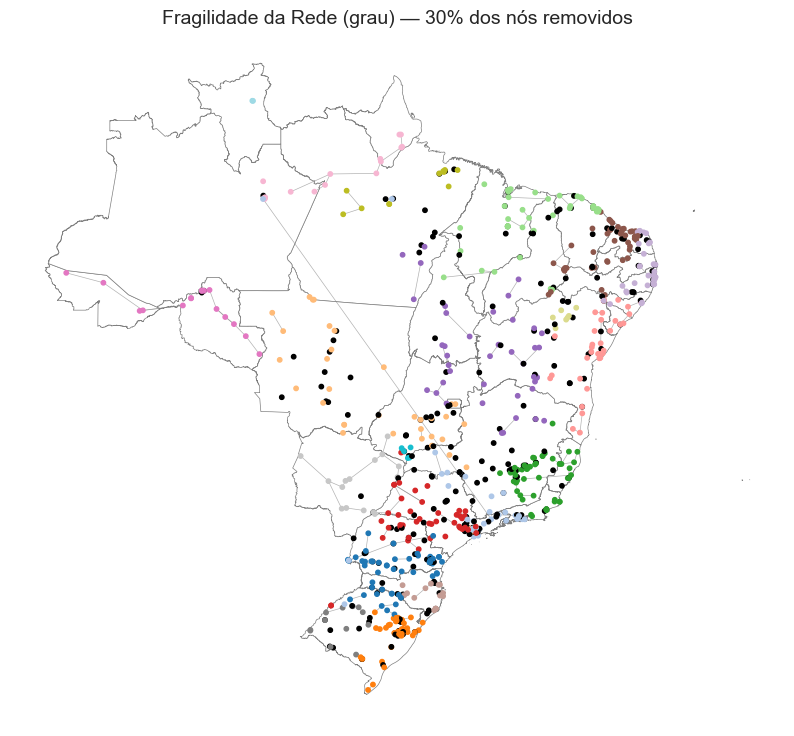

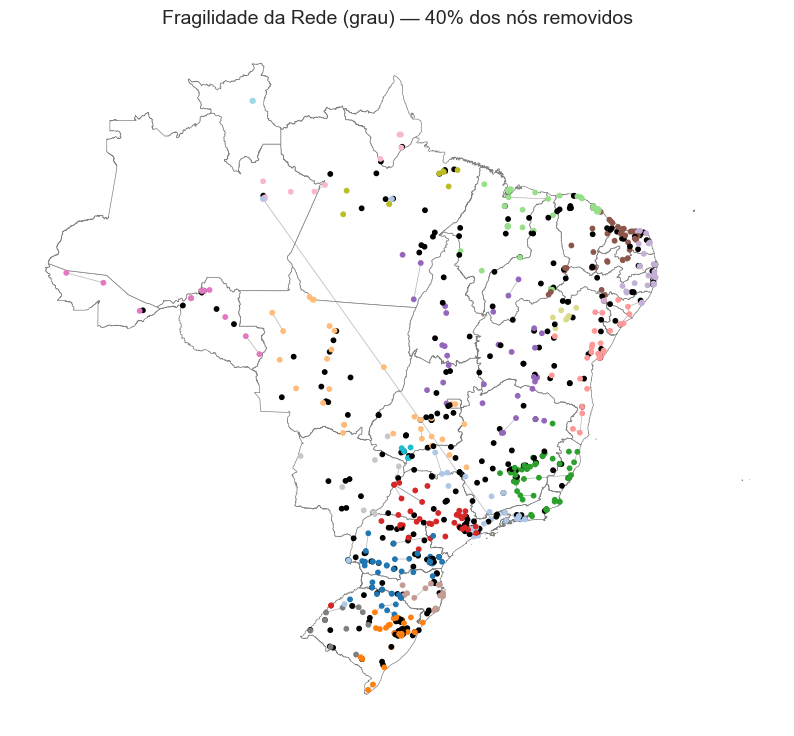

...

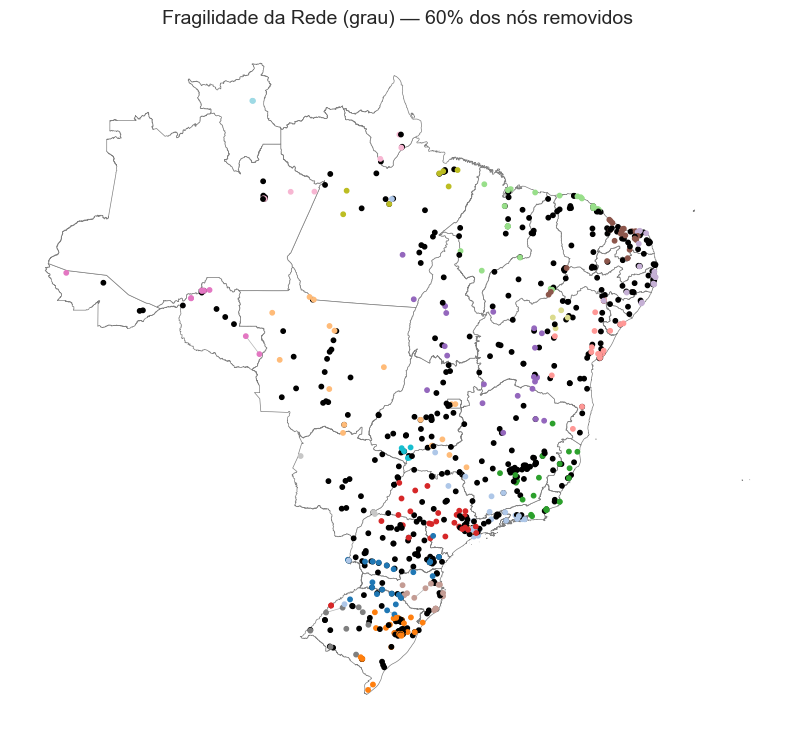

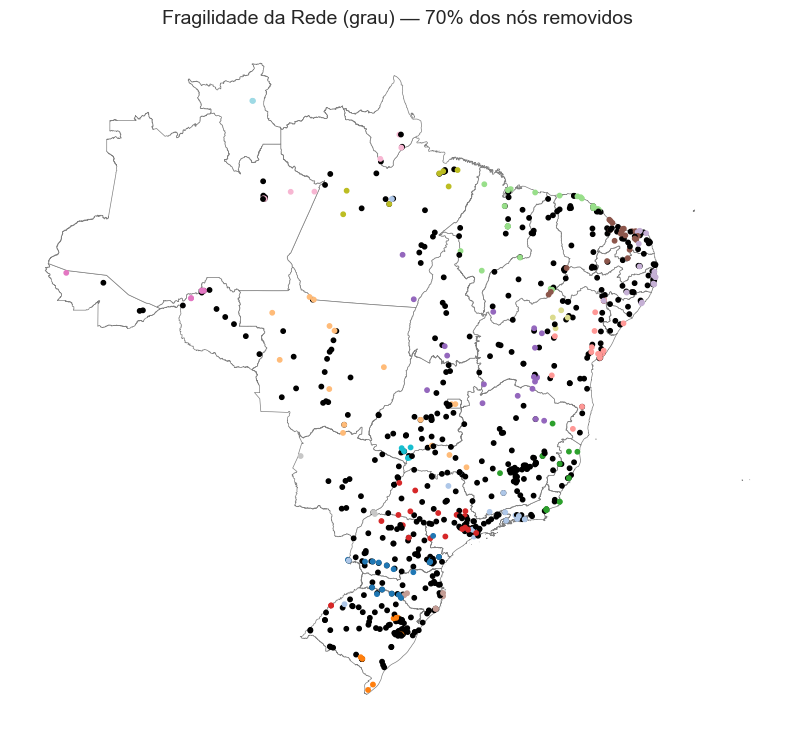

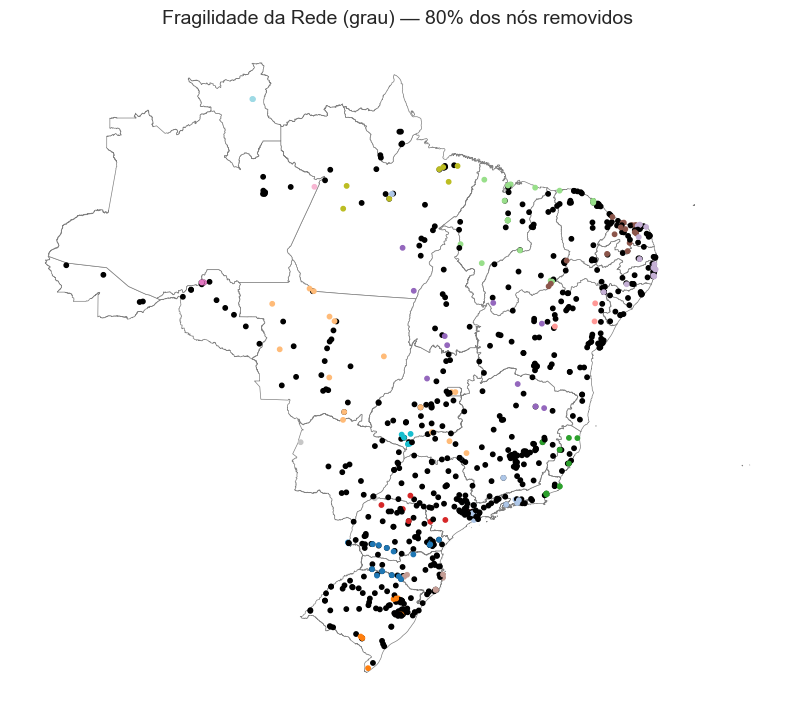

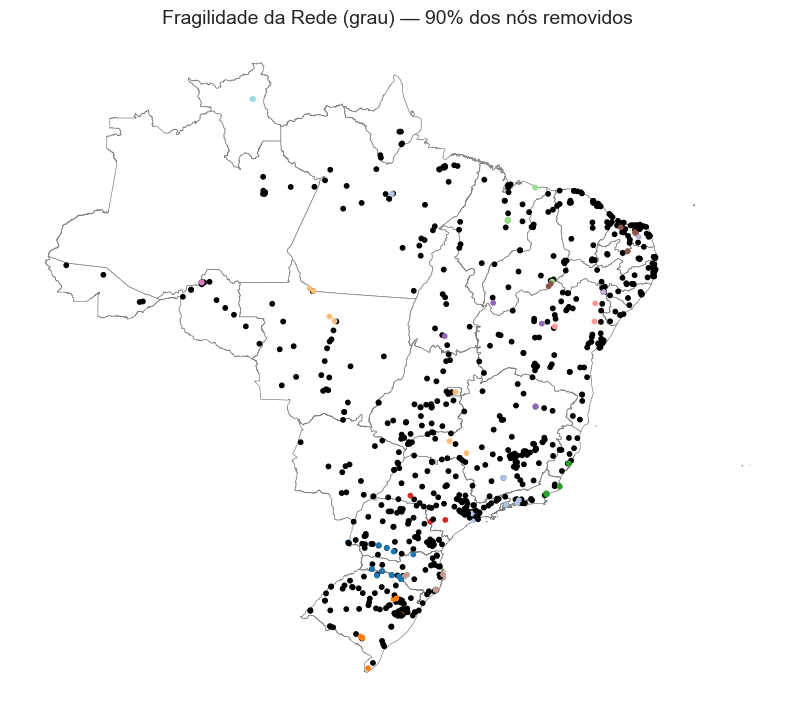

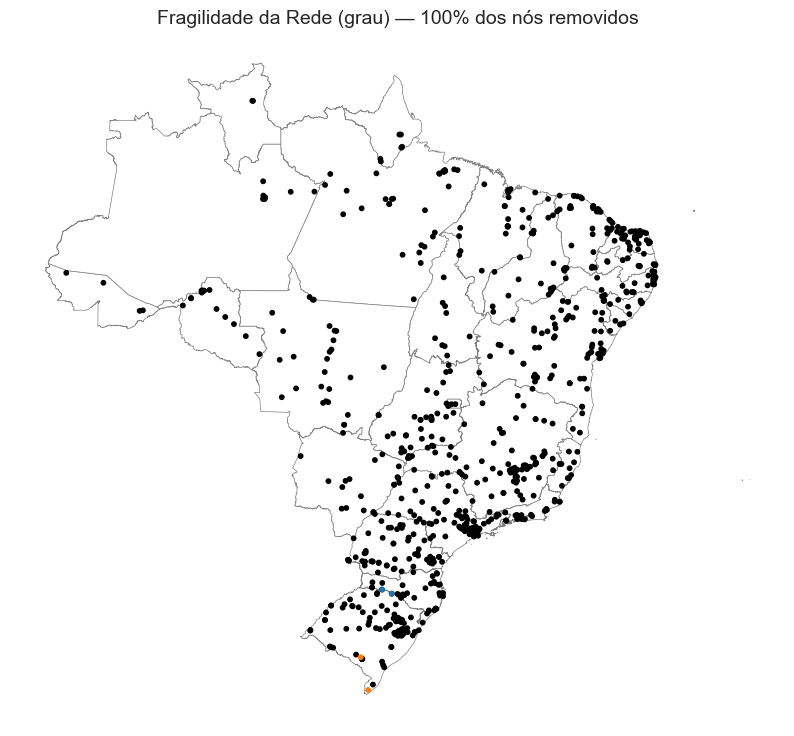

In [90]:
# 1. Carregue fundo cartográfico (ex: estados do Brasil)
gdf_fundo = gpd.read_file('C:/Users/victo/Documents/Ambiente/powergrid/dataset/BR_UF_2024/BR_UF_2024.shp')


# 2. Rode a simulação com visualização
visualizar_fragilidade_mpl(transmissao_br, gdf_fundo, metodo='grau', passo=0.1, salvar=False)


### 3.5.5 Visualizações das subestações e linhas de transmissão de energia eletrica do Brasil

#### 3.5.5.1 Mapa com as subestações e linhas de transmissão

In [96]:
# 1. Mapa centralizado (ex: Brasil)
mapa = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# 2. Subestações (nós)
for n, data in transmissao_br.nodes(data=True):
    if 'latitude' in data and 'longitude' in data:
        tooltip = f"Subestação: {n}<br>"
        popup = f"""
        <strong>Subestação: {n}</strong><br>
        <strong>Estado: {data.get('estado', 'N/A')}<br>
        <strong>Latitude: {data.get('latitude', 'N/A')}<br>
        <strong>Longitude: {data.get('longitude', 'N/A')}</strong>
        """
        folium.CircleMarker(
            location=[data['latitude'], data['longitude']],
            radius=4,
            color='red',
            fill=True,
            fill_opacity=0.7,
            popup=n
        ).add_to(mapa)

# 3. Linhas (arestas)
for u, v, d in transmissao_br.edges(data=True):
    no_u = transmissao_br.nodes[u]
    no_v = transmissao_br.nodes[v]
    if all(k in no_u for k in ['latitude', 'longitude']) and all(k in no_v for k in ['latitude', 'longitude']):
        tooltip = f"Linha de {u} → {v}"
        popup = f"""
        <strong>Origem:</strong> {u}<br>
        <strong>Destino:</strong> {v}<br>
        <strong>Nome da Linha:</strong> {d.get('nome_linha', 'n/a')}<br>
        <strong>Tensão (kV):</strong> {d.get('tensao_kV', 'n/a')}<br>
        <strong>Comprimento (km):</strong> {d.get('comprimento_km', 'n/a')}<br>
        <strong>Agente:</strong> {d.get('agente', 'n/a')}
        """
        folium.PolyLine(
            locations=[(no_u['latitude'], no_u['longitude']), (no_v['latitude'], no_v['longitude'])],
            color='blue',
            weight=2,
            opacity=0.6
        ).add_to(mapa)

# Exibir
mapa.save("mapa_transmissao.html")

mapa


#### 3.5.5.2 Mapa com as subestações com as suas respectivos nomes, graus e linhas de transmissão e seus respectivos sentidos, comprimentos, tensões, agentes

In [84]:

# 1. Mapa centralizado (ex: Brasil)
mapa = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# 2. Detectar comunidades
comunidades = list(nx.community.greedy_modularity_communities(transmissao_br))
comunidade_por_no = {n: i for i, com in enumerate(comunidades) for n in com}

# 3. Gerar colormap com cores distintas para até 20 comunidades
cmap_nodes = cm.get_cmap('tab20', len(comunidades))
norm_nodes = mcolors.Normalize(vmin=0, vmax=len(comunidades) - 1)

# 4. Subestações (nós)
for n, data in transmissao_br.nodes(data=True):
    if 'latitude' in data and 'longitude' in data:
        comunidade = comunidade_por_no.get(n, -1)
        cor_rgb = cmap_nodes(norm_nodes(comunidade)) if comunidade >= 0 else (0.5, 0.5, 0.5, 1)
        cor_hex = mcolors.to_hex(cor_rgb)

        tooltip = f"Subestação: {n}<br>Comunidade: {comunidade}<br>Grau: {transmissao_br.degree[n]}"
        popup = f"""
        <strong>Subestação:</strong> {n}<br>
        <strong>Comunidade:</strong> {comunidade}<br>
        <strong>Estado:</strong> {data.get('estado', 'N/A')}<br>
        <strong>Latitude:</strong> {data.get('latitude', 'N/A')}<br>
        <strong>Longitude:</strong> {data.get('longitude', 'N/A')}<br>
        <strong>Grau:</strong> {transmissao_br.degree[n]}
        """
        folium.CircleMarker(
            location=[data['latitude'], data['longitude']],
            radius=4,
            color=cor_hex,
            fill=True,
            fill_opacity=0.8,
            popup=popup,
            tooltip=tooltip
        ).add_to(mapa)

# 5. Pré-processar tensões e agentes
tensoes = [d.get('tensao_kV') for _, _, d in transmissao_br.edges(data=True) if isinstance(d.get('tensao_kV'), (int, float))]
vmin = min(tensoes)
vmax = max(tensoes)
cmap_edges = cm.get_cmap('plasma')
norm_edges = mcolors.Normalize(vmin=vmin, vmax=vmax)

# Mapear agentes para estilos de linha (dash_array)
estilos_agente = {
    'ELETROBRAS': '5, 5',
    'CHESF': '10, 10',
    'TAESA': '1, 5',
    'ISA CTEEP': '8, 4, 2, 4',
    'SITE': '0',  # contínua
    'n/a': '2, 2',
}
# Valor padrão para agentes desconhecidos
estilo_padrao = '2, 6'

# 6. Linhas (arestas)
for u, v, d in transmissao_br.edges(data=True):
    no_u = transmissao_br.nodes[u]
    no_v = transmissao_br.nodes[v]

    if all(k in no_u for k in ['latitude', 'longitude']) and all(k in no_v for k in ['latitude', 'longitude']):
        coords = [(no_u['latitude'], no_u['longitude']), (no_v['latitude'], no_v['longitude'])]

        tensao = d.get('tensao_kV')
        agente = d.get('agente', 'n/a')

        cor_rgb = cmap_edges(norm_edges(tensao)) if isinstance(tensao, (int, float)) else (0.5, 0.5, 0.5, 1)
        cor_hex = mcolors.to_hex(cor_rgb)

        dash_array = estilos_agente.get(agente.upper(), estilo_padrao)

        linha = folium.PolyLine(
            locations=coords,
            color=cor_hex,
            weight=2.5,
            opacity=0.7,
            dash_array=dash_array,
            tooltip=f"{u} → {v} ({agente})",
            popup=f"""
            <strong>Origem:</strong> {u}<br>
            <strong>Destino:</strong> {v}<br>
            <strong>Nome da Linha:</strong> {d.get('nome_linha', 'n/a')}<br>
            <strong>Tensão (kV):</strong> {tensao}<br>
            <strong>Comprimento (km):</strong> {d.get('comprimento_km', 'n/a')}<br>
            <strong>Agente:</strong> {agente}
            """
        ).add_to(mapa)

        # Seta de direção
        PolyLineTextPath(
            linha,
            text='      ➤   ',
            repeat=False,
            offset=6,
            attributes={'fill': cor_hex, 'font-weight': 'bold', 'font-size': '12'}
        ).add_to(mapa)

# 7. Salvar
mapa.save("mapa_transmissao.html")
mapa


C:\Users\victo\AppData\Local\Temp\ipykernel_6408\1729216246.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_nodes = cm.get_cmap('tab20', len(comunidades))
C:\Users\victo\AppData\Local\Temp\ipykernel_6408\1729216246.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_edges = cm.get_cmap('plasma')
